# Deep Learning CA1

**Name: Law Wei Tin** <br>
**Class: DAAA/FT/2A/02** <br>
**Admin number: 2415761** <br>



# Background Research

## Class Characteristics

<br><hr><br>

- Bean

**General Description:** <br> The images display beans with an elongated and thin shape. Their textures are smooth, and they are generally green.

**Potential Challenges:** <br> This class might be similar to Bottle Gourd, or Cucumbers, due to their similar shape. Our model might misclassify the classes.


<br><hr><br>

- Bitter Gourd

**General Description:** <br> They are elongated and bumpy with a rough texture. Their colors are green, and resemble beans somewhat.

**Potential Challenges:** <br> This bumpy and rough texture might be lost at low resolution. Similarly, the model might mistake this class for a Bean or Cucumber.


<br><hr><br>

- Brinjal

**General Description:** <br> Round, oval shape with a smooth and shiny texture. They generally have a purple body and a green head.

**Potential Challenges:** <br> The brinjals are easily distinguishable if color is retained. However, it is not due to assignment specifications.

<br><hr><br>

- Cabbage

**General Description:** <br> The cabbages have a round and leafy shape. They have a greenish white color, and a layered, leafy texture.

**Potential Challenges:** <br> At low resolutions, this class might represent a cauliflower due to their similar shape.

<br><hr><br>

- Capsicum

**General Description:** <br> They are generally a bit blocky and glossy. They have a smooth texture, and have a relatively wide variety of color. (red, green, yellow)

**Potential Challenges:** <br> Color is not retained due to assignment specifications, making the capsicum class lose one of its most distinguishable properties.


<br><hr><br>

- Cauliflower and Broccoli

**General Description:** <br> These two vegetables have a floret-shaped structure, and a granular texture. They are white or green in color.

**Potential Challenges:** <br> This class generally doesn't have any downsides, due to their distinct structure. Although it is a question whether their structure can be maintained at low resolutions.



<br><hr><br>

- Cucumber and Bottle_Gourd

**General Description:** <br> They are elongated with a smooth texture. Both are green in color.

**Potential Challenges:** <br> Similar to Beans, which might pose a problem for our model.



<br><hr><br>

- Potato

**General Description:** <br> Potatoes have a circular/oval shape, with a little bit of roughness in their texture. Potatos have a brownish yellow color.

**Potential Challenges:** <br> Might be easily confusable with other circular vegetables/fruits, such as Pumpkin or Tomato, especially at low resolutions.


<br><hr><br>

- Pumpkin

**General Description:** <br> Pumpkins are large and round, have a ribbed texture, and have a orange body and a green tip.

**Potential Challenges:** <br> Easily confusable with Potatos or Tomatos due to structure similarity, especially at low resolutions.


<br><hr><br>

- Radish and Carrot

**General Description:** <br> These two have a distinct structure, being tapered and pointy. Having a white/orange/red color, they also have a smooth texture.

**Potential Challenges:** <br> This class generally has no downsides, other than their most distinct structure potentially being lost at low resolutions.


<br><hr><br>

- Tomato

**General Description:** <br> Tomatoes are round, glossy and smooth. They are also red in color.

**Potential Challenges:** <br> Easily confusable with Potatos or Pumpkins due to structure similarity, especially at low resolutions.


<br><hr><br>


## Dataset implications:

<br>

After minor analysis on the dataset, we can observe that certain things are out of place. For example, the **class labels for the train, validation and testing are different across folders. We will delve deeper into this later.**

Furthermore, closely looking into the folders provided in the train dataset, we can view images in wrong classes. For example, there is **approximately 11 carrots in the 'Bean' folder in the train dataset.** This can cause **implications for our model and incorrect insights.** Therefore, we will handle this during our exploratory data analysis.


<br><hr><br>

## CNN Architectures:

<br>

Since this assignment focuses on convolutional neural networks (CNNs), we began by exploring some of the most influential and widely used CNN architectures in the field. Each of the models below brings different strengths to the table, and by implementing and comparing them on our vegetable-fruit dataset, we not only gain a deeper understanding of how architectural choices affect performance, but also build a robust classifier tailored to our problem.

<br>

- Custom CNN

**Why?** Serves as our lightweight, task-specific baseline. By hand-crafting the number and size of convolutional blocks, dropout rates, and classifier head, we can directly observe how each design decision impacts accuracy on small (23x23) grayscale images.

<br>

- VGG-Style CNN

**Why?** Emulates the simplicity and depth of the classic VGG family—stacked 3x3 convolutions with pooling—that's known for very clean feature hierarchies. Although originally designed for 224x224 RGB inputs, a "mini-VGG" adapted to our 23x23 and 101x101 grayscale inputs shows how deeper, uniform layers can improve representational power.


<br>

- ResNet-50 (Mini-ResNet Variant)

**Why?** Introduces residual connections that help gradient flow through very deep networks, preventing vanishing gradients. Even a slimmed-down "mini-ResNet" demonstrates how identity shortcuts let us stack more layers without performance degradation—critical when exploring depth vs. input resolution trade-offs.

<br>

- DenseNet-Style CNN

**Why?** Uses dense connectivity, where each layer receives the outputs of all previous layers. This encourages maximal feature reuse and reduces overall parameter count. On small-input datasets, DenseNets often generalize well, making them a valuable counterpoint to both plain and residual CNNs.

<br>

- MobileNet-Lite

**Why?** Employs depthwise separable convolutions to dramatically cut computation and model size while retaining accuracy. This is especially important for low-resolution inputs or edge-device deployment. Comparing MobileNet-Lite with our heavier models illustrates the trade-off between efficiency and representational capacity.

## pip installing necessary libraries

- visualkeras: Used to display our model architecture in a very visually appealing way.

- keras-tuner: Used to hypertune our model.

In [ ]:
# pip install visualkeras

In [ ]:
# pip install keras-tuner

# Importing of libraries

In [ ]:
# OS module for accessing the images
import os

# TensorFlow for building and training deep learning models
import tensorflow as tf
# Pandas for data manipulation and analysis (e.g., reading CSV files, handling dataframes)
import pandas as pd

# NumPy for numerical operations, especially arrays and matrices
import numpy as np

# Matplotlib for plotting and visualizing data and training metrics
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Random module for generating random numbers, useful for reproducibility or data augmentation
import random
import math

# OpenCV for image processing tasks (e.g., reading, transforming images)
import cv2

# Shutil for file operations such as copying, moving, and deleting files and directories
import shutil

# PIL (Python Imaging Library) for image manipulation like resizing, enhancing, or converting
from PIL import Image, ImageEnhance, ImageOps, ImageFont

# Libraries used for removing duplicates
import hashlib
from collections import defaultdict

# Keras Tuner: tools for hyperparameter tuning using Random Search and HyperParameters
from keras_tuner import HyperParameters, RandomSearch

# Scikit-learn metrics for evaluating model performance: confusion matrix, visualization
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report

# Visualizing Model Architecture
import visualkeras

In [ ]:
# Mounting drive to access folders inside
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Importing of dataset

Here we will use a command in order to unzip the dataset folder.

We uploaded a zipped folder because uploading a unzipped folder will take too long. Unzipping in colab takes an approximate 10 seconds.

In [ ]:
# Command for unzipping zipped folder
!unzip -q /content/drive/MyDrive/Datasets/image_dataset.zip

In [ ]:
dataset_path = "/content/Dataset for CA1 part A - AY2526S1/train"

# Exploratory Data Analysis

We will begin by conducting an exploratory data analysis of the data, to gain a better understanding of the characteristics of the dataset.

In [ ]:
# Show all available classes in train set, and we establish this as the main class folder names
class_names = sorted(os.listdir("/content/Dataset for CA1 part A - AY2526S1/train"))
print(class_names)

['Bean', 'Bitter_Gourd', 'Brinjal', 'Cabbage', 'Capsicum', 'Cauliflower and Broccoli', 'Cucumber and Bottle_Gourd', 'Potato', 'Pumpkin', 'Radish and Carrot', 'Tomato']


In [ ]:
# Viewing all folder names in each set, to checking if there are any differences (which there are)
train_classes = sorted(os.listdir("/content/Dataset for CA1 part A - AY2526S1/train"))
val_classes = sorted(os.listdir("/content/Dataset for CA1 part A - AY2526S1/validation"))
test_classes = sorted(os.listdir("/content/Dataset for CA1 part A - AY2526S1/test"))

print("Train classes:", train_classes)
print("Validation classes:", val_classes)
print("Test classes:", test_classes)

Train classes: ['Bean', 'Bitter_Gourd', 'Brinjal', 'Cabbage', 'Capsicum', 'Cauliflower and Broccoli', 'Cucumber and Bottle_Gourd', 'Potato', 'Pumpkin', 'Radish and Carrot', 'Tomato']
Validation classes: ['Bean', 'Bitter_Gourd', 'Brinjal', 'Cabbage', 'Capsicum', 'Cauliflower with Broccoli', 'Cucumber with Bottle_Gourd', 'Potato', 'Pumpkin', 'Radish with Carrot', 'Tomato']
Test classes: ['Bean', 'Bitter_Gourd', 'Bottle_Gourd and Cucumber', 'Brinjal', 'Broccoli and Cauliflower', 'Cabbage', 'Capsicum (apparently)', 'Carrot and Radish', 'Potato', 'Pumpkin (purportedly)', 'Tomato (ostensibly)']


We notice that some of the names of the folders inside the train class and the validation class is different. For example, the names of 'Cucumber and Bottle_Gourd' inside the train dataset and 'Cucumber with Bottle_Gourd' inside the validation dataset. This can result in wrong model evaluations.

We also observe wrong names in the testing dataset as well.


In order to analyze this issue more in depth, we will print out the images of each set, the train, validation and test.

## Data Visualization

Firstly, we take a look at batches of the dataset

In [ ]:
# Number of images to show
# Grid settings: 4 columns, compute rows as needed
num_classes = 11
ncols = 4
nrows = math.ceil(num_classes / ncols)

### Training dataset

We will observe the **coloured version and the grayscale version**

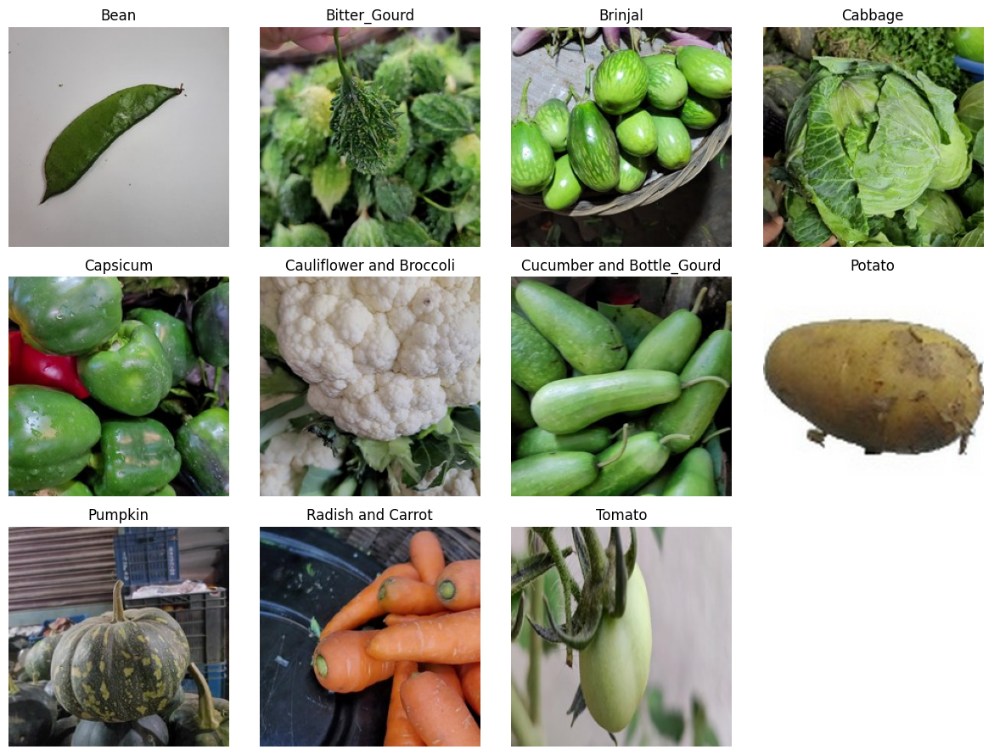

In [ ]:
plt.figure(figsize=(ncols * 3, nrows * 3))

for idx, cls in enumerate(class_names):
    class_path = os.path.join(dataset_path, cls)
    # pick one random image from this class
    img_name = random.choice(os.listdir(class_path))
    img_path = os.path.join(class_path, img_name)

    # read & convert to RGB
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    ax = plt.subplot(nrows, ncols, idx + 1)
    ax.imshow(image)
    ax.set_title(cls)
    ax.axis('off')

# If there are any empty subplots (e.g. 12th slot), turn off their axes:
for j in range(idx + 2, nrows * ncols + 1):
    plt.subplot(nrows, ncols, j).axis('off')

plt.tight_layout()
plt.show()

Next, we show the grayscaled version of the train set.

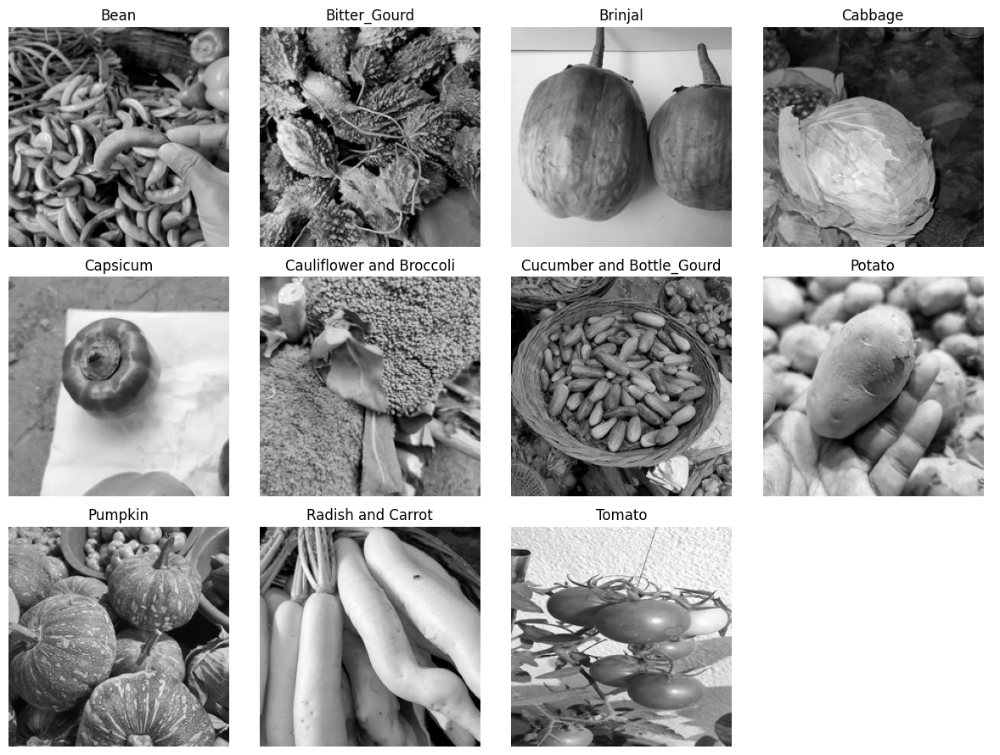

In [ ]:
plt.figure(figsize=(ncols * 3, nrows * 3))

for idx, cls in enumerate(class_names):
    class_path = os.path.join(dataset_path, cls)
    # pick one random image from this class
    img_name = random.choice(os.listdir(class_path))
    img_path = os.path.join(class_path, img_name)

    # read & convert to grayscale
    image = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

    ax = plt.subplot(nrows, ncols, idx + 1)
    ax.imshow(image, cmap='gray')
    ax.set_title(cls)
    ax.axis('off')

# If there are any empty subplots (e.g. 12th slot), turn off their axes:
for j in range(idx + 2, nrows * ncols + 1):
    plt.subplot(nrows, ncols, j).axis('off')

plt.tight_layout()
plt.show()

### Validation dataset

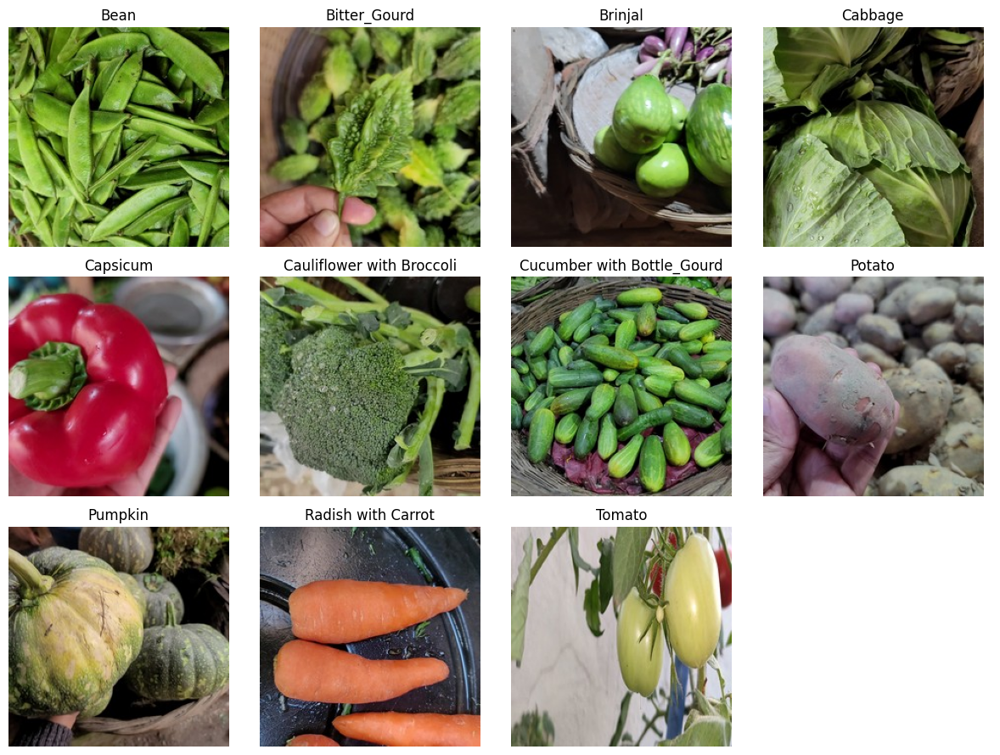

In [ ]:
plt.figure(figsize=(ncols * 3, nrows * 3))

for idx, cls in enumerate(val_classes):
    class_path = os.path.join("/content/Dataset for CA1 part A - AY2526S1/validation", cls)
    # pick one random image from this class
    img_name = random.choice(os.listdir(class_path))
    img_path = os.path.join(class_path, img_name)

    # read & convert to RGB
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    ax = plt.subplot(nrows, ncols, idx + 1)
    ax.imshow(image)
    ax.set_title(cls)
    ax.axis('off')

# If there are any empty subplots (e.g. 12th slot), turn off their axes:
for j in range(idx + 2, nrows * ncols + 1):
    plt.subplot(nrows, ncols, j).axis('off')

plt.tight_layout()
plt.show()

Next, we show the grayscaled version of the validation set.

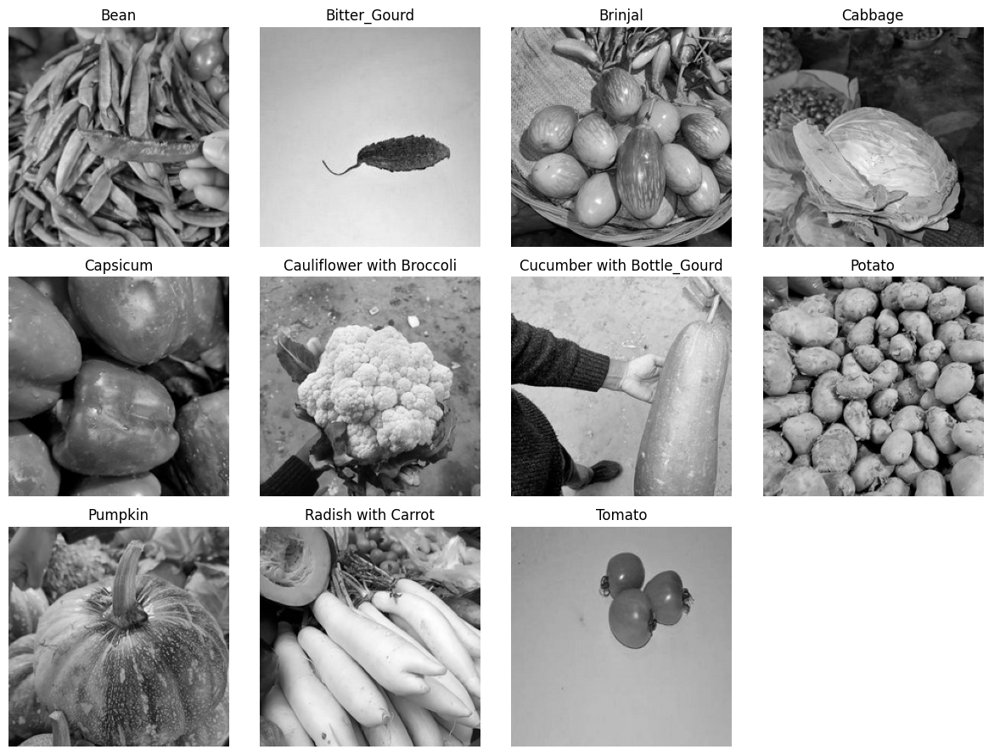

In [ ]:
plt.figure(figsize=(ncols * 3, nrows * 3))

for idx, cls in enumerate(val_classes):
    class_path = os.path.join("/content/Dataset for CA1 part A - AY2526S1/validation", cls)
    # pick one random image from this class
    img_name = random.choice(os.listdir(class_path))
    img_path = os.path.join(class_path, img_name)

    # read & convert to RGB
    image = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

    ax = plt.subplot(nrows, ncols, idx + 1)
    ax.imshow(image, cmap='gray')
    ax.set_title(cls)
    ax.axis('off')

# If there are any empty subplots (e.g. 12th slot), turn off their axes:
for j in range(idx + 2, nrows * ncols + 1):
    plt.subplot(nrows, ncols, j).axis('off')

plt.tight_layout()
plt.show()

### Test dataset

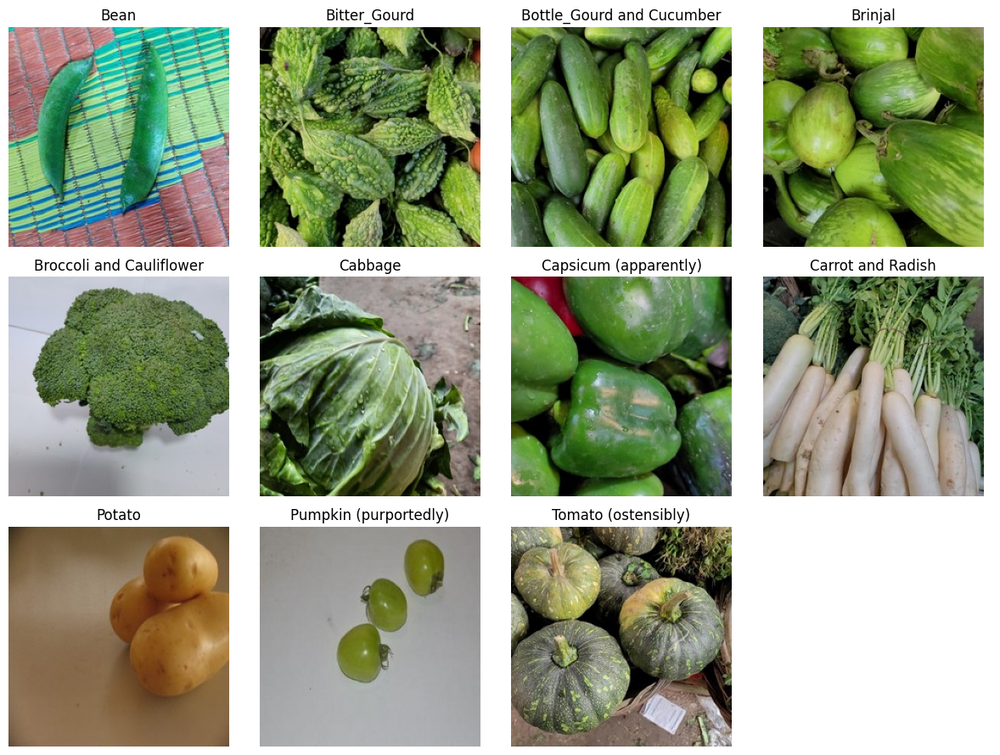

In [ ]:
plt.figure(figsize=(ncols * 3, nrows * 3))

for idx, cls in enumerate(test_classes):
    class_path = os.path.join("/content/Dataset for CA1 part A - AY2526S1/test", cls)
    # pick one random image from this class
    img_name = random.choice(os.listdir(class_path))
    img_path = os.path.join(class_path, img_name)

    # read & convert to RGB
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    ax = plt.subplot(nrows, ncols, idx + 1)
    ax.imshow(image)
    ax.set_title(cls)
    ax.axis('off')

# If there are any empty subplots (e.g. 12th slot), turn off their axes:
for j in range(idx + 2, nrows * ncols + 1):
    plt.subplot(nrows, ncols, j).axis('off')

plt.tight_layout()
plt.show()

We can already observe something wrong here. Tomatos are labeled as pumpkins, and pumpkins are labeled as tomatos. There are also wrong folder names. We will discuss this later. Next, we show the grayscaled version of the test set.

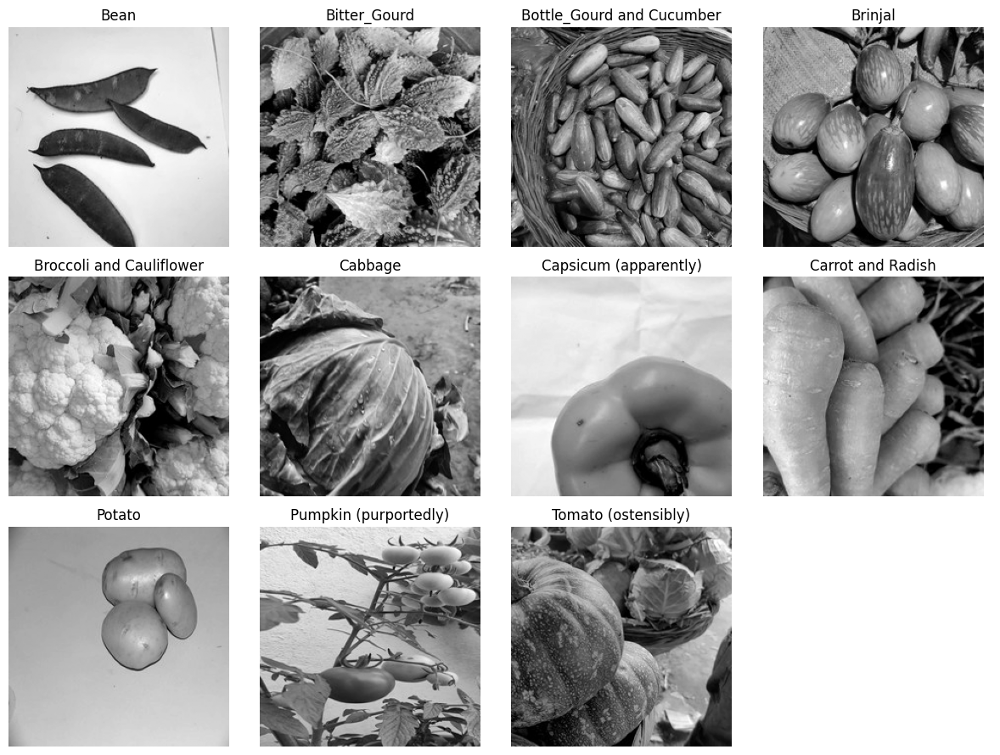

In [ ]:
plt.figure(figsize=(ncols * 3, nrows * 3))

for idx, cls in enumerate(test_classes):
    class_path = os.path.join("/content/Dataset for CA1 part A - AY2526S1/test", cls)
    # pick one random image from this class
    img_name = random.choice(os.listdir(class_path))
    img_path = os.path.join(class_path, img_name)

    # read & convert to grayscale
    image = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

    ax = plt.subplot(nrows, ncols, idx + 1)
    ax.imshow(image, cmap='gray')
    ax.set_title(cls)
    ax.axis('off')

# If there are any empty subplots (e.g. 12th slot), turn off their axes:
for j in range(idx + 2, nrows * ncols + 1):
    plt.subplot(nrows, ncols, j).axis('off')

plt.tight_layout()
plt.show()

We notice something terribly wrong in the test set.

<br>
<hr>
<br>

For example, the class name: `Pumpkin (purportedly)` contains images of **tomatos**. And on the contrary, the class name `Tomato (ostensibly)` contains images of **pumpkins**.

We will need to swap the names of these two classes in order to adhere to proper convention.

<br>
<hr>
<br>

Another example would be `Capsicum (apparently)`. There shouldn't be an (apparently), because it is infact full of capsicum images.

There are also the issues that we mentioned earlier.

<br>
<hr>
<br>

We will need to change this in order to prevent our models from classifying wrongly, and to adhere to proper naming convention.

## Correcting errors in folder names

We will be using commands in order to rename the folders.

In [ ]:
!mv /content/'Dataset for CA1 part A - AY2526S1'/test/"Pumpkin (purportedly)" /content/'Dataset for CA1 part A - AY2526S1'/test/"Tomato"
!mv /content/'Dataset for CA1 part A - AY2526S1'/test/"Tomato (ostensibly)" /content/'Dataset for CA1 part A - AY2526S1'/test/"Pumpkin"
!mv /content/'Dataset for CA1 part A - AY2526S1'/test/"Capsicum (apparently)" /content/'Dataset for CA1 part A - AY2526S1'/test/"Capsicum"
!mv /content/'Dataset for CA1 part A - AY2526S1'/test/"Bottle_Gourd and Cucumber" /content/'Dataset for CA1 part A - AY2526S1'/test/"Cucumber and Bottle_Gourd"
!mv /content/'Dataset for CA1 part A - AY2526S1'/test/"Broccoli and Cauliflower" /content/'Dataset for CA1 part A - AY2526S1'/test/"Cauliflower and Broccoli"
!mv /content/'Dataset for CA1 part A - AY2526S1'/test/"Carrot and Radish" /content/'Dataset for CA1 part A - AY2526S1'/test/"Radish and Carrot"

!mv /content/'Dataset for CA1 part A - AY2526S1'/validation/"Cucumber with Bottle_Gourd" /content/'Dataset for CA1 part A - AY2526S1'/validation/"Cucumber and Bottle_Gourd"
!mv /content/'Dataset for CA1 part A - AY2526S1'/validation/"Cauliflower with Broccoli" /content/'Dataset for CA1 part A - AY2526S1'/validation/"Cauliflower and Broccoli"
!mv /content/'Dataset for CA1 part A - AY2526S1'/validation/"Radish with Carrot" /content/'Dataset for CA1 part A - AY2526S1'/validation/"Radish and Carrot"

Checking for correct folder names:

In [ ]:
train_classes = sorted(os.listdir("/content/Dataset for CA1 part A - AY2526S1/train"))
val_classes = sorted(os.listdir("/content/Dataset for CA1 part A - AY2526S1/validation"))
test_classes = sorted(os.listdir("/content/Dataset for CA1 part A - AY2526S1/test"))

print("Train classes:", train_classes)
print("Validation classes:", val_classes)
print("Test classes:", test_classes)

Train classes: ['Bean', 'Bitter_Gourd', 'Brinjal', 'Cabbage', 'Capsicum', 'Cauliflower and Broccoli', 'Cucumber and Bottle_Gourd', 'Potato', 'Pumpkin', 'Radish and Carrot', 'Tomato']
Validation classes: ['Bean', 'Bitter_Gourd', 'Brinjal', 'Cabbage', 'Capsicum', 'Cauliflower and Broccoli', 'Cucumber and Bottle_Gourd', 'Potato', 'Pumpkin', 'Radish and Carrot', 'Tomato']
Test classes: ['Bean', 'Bitter_Gourd', 'Brinjal', 'Cabbage', 'Capsicum', 'Cauliflower and Broccoli', 'Cucumber and Bottle_Gourd', 'Potato', 'Pumpkin', 'Radish and Carrot', 'Tomato']


## Addressing the major issues in the train dataset

Earlier, we mentioned that we observed that there are Carrots in the Bean dataset. More accurately, there are 11 carrots in the bean dataset, which can mess up our model training.

We want to address this now, in order to prevent any implications caused when addressing stuff like class imbalance.

In [ ]:
# Removing carrots in bean folder
# Directory containing the images
bean_dir = '/content/Dataset for CA1 part A - AY2526S1/train/Bean'

# List of filenames (without .jpg extension) to remove
filenames_to_remove = ['0001', '0002', '0003', '0004',
                       '0017', '0018', '0019', '0020',
                       '0033', '0049', '0050']

# Remove each specified file
for name in filenames_to_remove:
    file_path = os.path.join(bean_dir, f'{name}.jpg')
    if os.path.exists(file_path):
        os.remove(file_path)
        print(f"Deleted: {file_path}")
    else:
        print(f"File not found: {file_path}")

Deleted: /content/Dataset for CA1 part A - AY2526S1/train/Bean/0001.jpg
Deleted: /content/Dataset for CA1 part A - AY2526S1/train/Bean/0002.jpg
Deleted: /content/Dataset for CA1 part A - AY2526S1/train/Bean/0003.jpg
Deleted: /content/Dataset for CA1 part A - AY2526S1/train/Bean/0004.jpg
Deleted: /content/Dataset for CA1 part A - AY2526S1/train/Bean/0017.jpg
Deleted: /content/Dataset for CA1 part A - AY2526S1/train/Bean/0018.jpg
Deleted: /content/Dataset for CA1 part A - AY2526S1/train/Bean/0019.jpg
Deleted: /content/Dataset for CA1 part A - AY2526S1/train/Bean/0020.jpg
Deleted: /content/Dataset for CA1 part A - AY2526S1/train/Bean/0033.jpg
Deleted: /content/Dataset for CA1 part A - AY2526S1/train/Bean/0049.jpg
Deleted: /content/Dataset for CA1 part A - AY2526S1/train/Bean/0050.jpg


## Viewing Existing Duplicates



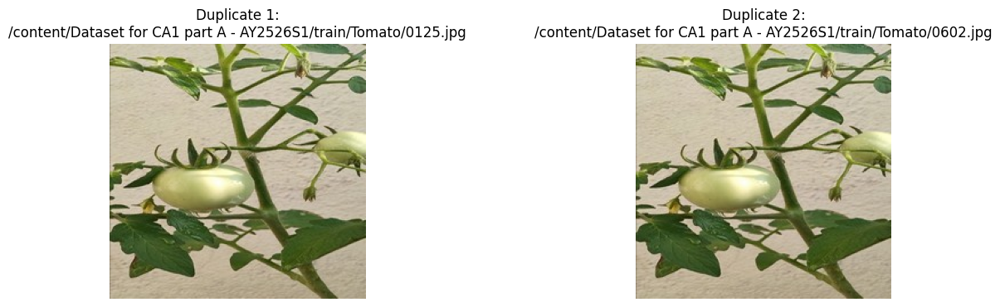

In [ ]:
# Step 1: Helper to compute MD5 hash
def file_hash(filepath):
    hasher = hashlib.md5()
    with open(filepath, 'rb') as f:
        buf = f.read()
        hasher.update(buf)
    return hasher.hexdigest()

# Step 2: Scan and collect duplicates
root_dir = '/content/Dataset for CA1 part A - AY2526S1/train'
hash_dict = defaultdict(list)

for folder in os.listdir(root_dir):
    folder_path = os.path.join(root_dir, folder)
    if os.path.isdir(folder_path):
        for file in os.listdir(folder_path):
            if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                path = os.path.join(folder_path, file)
                hash_val = file_hash(path)
                hash_dict[hash_val].append(path)

# Step 3: Display first duplicate pair (if any)
displayed = False
for files in hash_dict.values():
    if len(files) > 1:
        img1 = Image.open(files[0])
        img2 = Image.open(files[1])

        plt.figure(figsize=(15, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(img1)
        plt.title(f'Duplicate 1:\n{files[0]}')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(img2)
        plt.title(f'Duplicate 2:\n{files[1]}')
        plt.axis('off')

        plt.show()
        displayed = True
        break

if not displayed:
    print("No duplicates found.")

In [ ]:
# Remove all duplicate files (keep the first file in each group)
duplicates_removed = 0

for files in hash_dict.values():
    if len(files) > 1:
        for duplicate_path in files[1:]:  # skip first, delete the rest
            os.remove(duplicate_path)
            print(f"Deleted duplicate: {duplicate_path}")
            duplicates_removed += 1

print(f"\nTotal duplicates removed: {duplicates_removed}")

Deleted duplicate: /content/Dataset for CA1 part A - AY2526S1/train/Tomato/0602.jpg
Deleted duplicate: /content/Dataset for CA1 part A - AY2526S1/train/Bean/0028.jpg
Deleted duplicate: /content/Dataset for CA1 part A - AY2526S1/train/Bean/0026 - Copy.jpg
Deleted duplicate: /content/Dataset for CA1 part A - AY2526S1/train/Bean/0029.jpg
Deleted duplicate: /content/Dataset for CA1 part A - AY2526S1/train/Bean/0030 - Copy.jpg
Deleted duplicate: /content/Dataset for CA1 part A - AY2526S1/train/Cabbage/0438.jpg

Total duplicates removed: 6


## Observing the difference between the different pixel sizes

We will show a picture of the original image, a 23x23 image and a 101x101 image.

We wil display a colored version for easier interpretability.

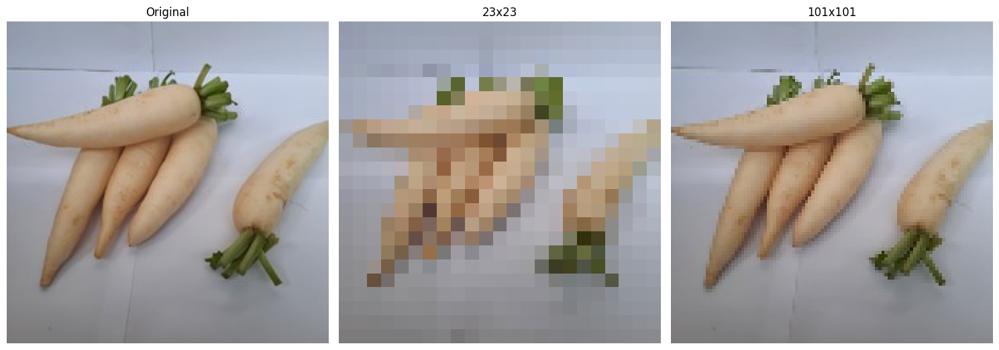

In [ ]:
# Pick a random class
random_class = random.choice(os.listdir(dataset_path))
class_path = os.path.join(dataset_path, random_class)

# Pick a random image from the class
random_image = random.choice(os.listdir(class_path))
image_path = os.path.join(class_path, random_image)

# Read the original image (color)
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Resize to 23x23 and 101x101
small_image = cv2.resize(image_rgb, (23, 23))
large_image = cv2.resize(image_rgb, (101, 101))

# Plot side by side
plt.figure(figsize=(15, 8))

# Original
plt.subplot(1, 3, 1)
plt.imshow(image_rgb)
plt.title('Original')
plt.axis('off')

# 23x23
plt.subplot(1, 3, 2)
plt.imshow(small_image)
plt.title('23x23')
plt.axis('off')

# 101x101
plt.subplot(1, 3, 3)
plt.imshow(large_image)
plt.title('101x101')
plt.axis('off')

plt.tight_layout()
plt.show()

## Class Distribution

When training a machine learning model, it is always important to check the distribution of the different classes in the dataset. We can check if any class balancing is needed.

If classes are imbalanced, our model might perform well on one class but perform poorly on another class.

In [ ]:
class_names = []
n_images_per_class = []

for class_name in os.listdir(dataset_path):
    class_path = os.path.join(dataset_path, class_name)
    if os.path.isdir(class_path):
        n_images = len([f for f in os.listdir(class_path)])
        class_names.append(class_name)
        n_images_per_class.append(n_images)
        print(f"{class_name:15s}: {n_images} images")

Capsicum       : 351 images
Tomato         : 954 images
Bitter_Gourd   : 720 images
Pumpkin        : 814 images
Bean           : 780 images
Brinjal        : 868 images
Cabbage        : 502 images
Cucumber and Bottle_Gourd: 875 images
Radish and Carrot: 504 images
Potato         : 377 images
Cauliflower and Broccoli: 948 images


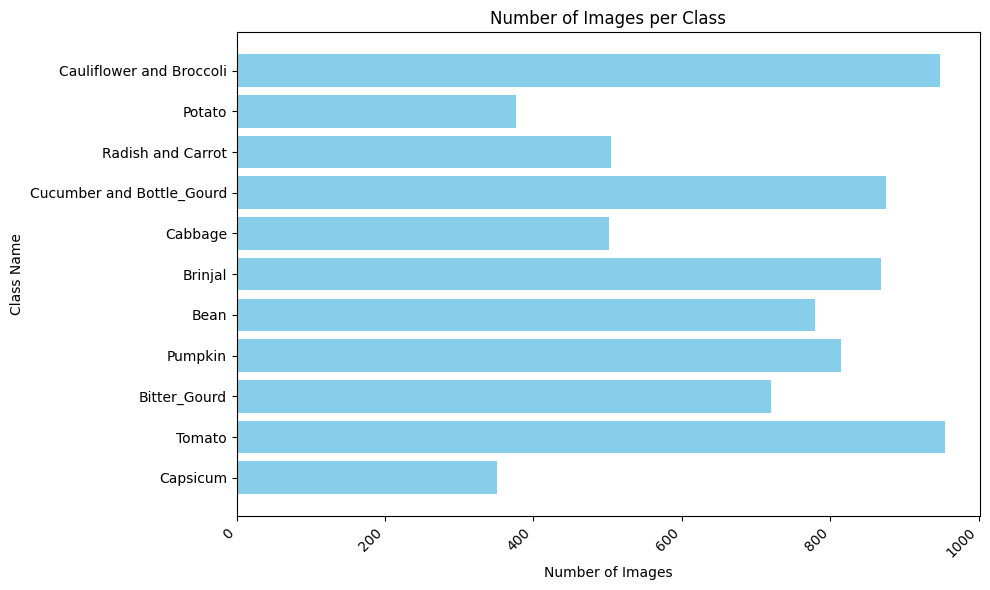

In [ ]:
# Plotting the bar chart
plt.figure(figsize=(10, 6))
plt.barh(class_names, n_images_per_class, color='skyblue')
plt.xlabel('Number of Images')
plt.ylabel('Class Name')
plt.title('Number of Images per Class')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()  # To make sure everything fits
plt.show()

We observe that some classes contain **significantly** more data than others, which may cause our model to perform worse on classes with less data.

<br>
<hr>
<br>

To address this, we will add more images to the underrepresented classes, ensuring that each class has the **same number of images—954, which is the amount in the class with the most data prior to balancing**.

<br>
<hr>
<br>

### How will we achieve this?



To achieve this, we will **replicate some images from the dataset and apply augmentation techniques to generate new variations of these images.** This will help increase the dataset size while **reducing the risk of overfitting by introducing more diversity** in the data.

In [ ]:
# Paths
balanced_dataset_path = '/content/dataset/balanced_train'     # new folder

# Create balanced folder
os.makedirs(balanced_dataset_path, exist_ok=True)

max_count = max(n_images_per_class)
print(f"Largest class has {max_count} images.")

# Simple augmentation function
def augment_image(img_path):
    img = Image.open(img_path)

    # Random horizontal flip
    if random.random() > 0.5:
        img = ImageOps.mirror(img)

    # Random slight rotation
    angle = random.uniform(-15, 15)
    img = img.rotate(angle)

    # Random brightness adjustment
    enhancer = ImageEnhance.Brightness(img)
    img = enhancer.enhance(random.uniform(0.8, 1.2))

    return img

# For each class
for cls in os.listdir(dataset_path):
    cls_folder = os.path.join(dataset_path, cls)

    # Ensure it's a directory
    if not os.path.isdir(cls_folder):
        continue

    images = os.listdir(cls_folder)
    current_count = len(images)
    print(f'{cls}: {current_count}')

    # Create class folder in balanced dataset
    new_cls_folder = os.path.join(balanced_dataset_path, cls)
    os.makedirs(new_cls_folder, exist_ok=True)

    # First copy all original images
    for img in images:
        src_path = os.path.join(cls_folder, img)
        dst_path = os.path.join(new_cls_folder, img)
        shutil.copyfile(src_path, dst_path)

    # Oversample if needed to match max_count
    if current_count < max_count:
        extra_needed = max_count - current_count
        extra_images = random.choices(images, k=extra_needed)
        print(f"Augmenting {cls} with {extra_needed} images.")

        for idx, img in enumerate(extra_images):
            src_path = os.path.join(cls_folder, img)
            new_img = augment_image(src_path)
            dst_path = os.path.join(new_cls_folder, f"aug_{idx}_{img}")
            new_img.save(dst_path)

print("Dataset oversampled and lightly augmented!")

Largest class has 954 images.
Capsicum: 351
Augmenting Capsicum with 603 images.
Tomato: 954
Bitter_Gourd: 720
Augmenting Bitter_Gourd with 234 images.
Pumpkin: 814
Augmenting Pumpkin with 140 images.
Bean: 780
Augmenting Bean with 174 images.
Brinjal: 868
Augmenting Brinjal with 86 images.
Cabbage: 502
Augmenting Cabbage with 452 images.
Cucumber and Bottle_Gourd: 875
Augmenting Cucumber and Bottle_Gourd with 79 images.
Radish and Carrot: 504
Augmenting Radish and Carrot with 450 images.
Potato: 377
Augmenting Potato with 577 images.
Cauliflower and Broccoli: 948
Augmenting Cauliflower and Broccoli with 6 images.
Dataset oversampled and lightly augmented!


In [ ]:
balanced_class_names = []
balanced_n_images_per_class = []

for class_name in os.listdir(balanced_dataset_path):
    class_path = os.path.join(balanced_dataset_path, class_name)
    if os.path.isdir(class_path):
        n_images = len([f for f in os.listdir(class_path)])
        balanced_class_names.append(class_name)
        balanced_n_images_per_class.append(n_images)
        print(f"{class_name:15s}: {n_images} images")

Capsicum       : 954 images
Tomato         : 954 images
Bitter_Gourd   : 954 images
Pumpkin        : 954 images
Bean           : 954 images
Brinjal        : 954 images
Cabbage        : 954 images
Cucumber and Bottle_Gourd: 954 images
Radish and Carrot: 954 images
Potato         : 954 images
Cauliflower and Broccoli: 954 images


## Average Image of Grayscaled Dataset

(note: showed the average image of the original dataset, not our balanced dataset. therefore, this is the original average image)

Skipping /content/Dataset for CA1 part A - AY2526S1/train/Bitter_Gourd/0526.jpg due to wrong size: (224, 205)
Skipping /content/Dataset for CA1 part A - AY2526S1/train/Bitter_Gourd/0609.jpg due to wrong size: (224, 200)


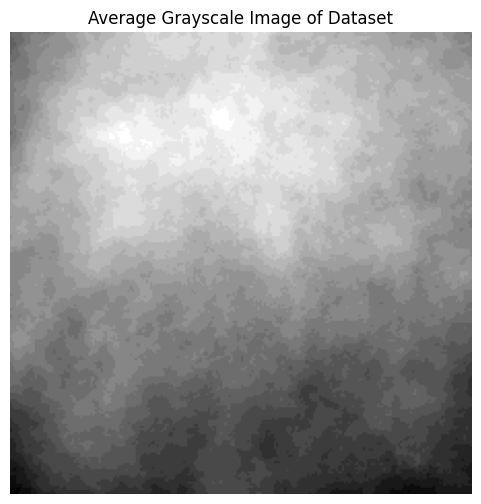

In [ ]:
# Initialize variables
sum_image = None
count = 0
expected_size = (224, 224)  # Height, width

for cls_name in os.listdir(dataset_path):
    cls_path = os.path.join(dataset_path, cls_name)

    if os.path.isdir(cls_path):
        for img_name in os.listdir(cls_path):
            img_path = os.path.join(cls_path, img_name)
            try:
                # Open and convert image to grayscale
                img = Image.open(img_path).convert("L")  # "L" mode = 8-bit grayscale

                # Resize if needed
                if img.size != (expected_size[1], expected_size[0]):  # PIL uses (width, height)
                    print(f"Skipping {img_path} due to wrong size: {img.size}")
                    continue

                img_array = np.array(img).astype(np.float32)

                if sum_image is None:
                    sum_image = img_array
                else:
                    sum_image += img_array
                count += 1
            except Exception as e:
                print(f"Error processing {img_path}: {e}")

# Calculate average
average_image = sum_image / count
average_image = np.clip(average_image, 0, 255).astype(np.uint8)

# Display the grayscale average image
plt.figure(figsize=(6, 6))
plt.imshow(average_image, cmap='gray')
plt.title('Average Grayscale Image of Dataset')
plt.axis('off')
plt.show()

This is the average image of the dataset. Although it is not clear, we can see that the average color is green.

We also notice that there are some images that are of wrong size, and we will handle that during the preprocessing part. Right now, we are just exploring the dataset. This issue can simply be resolved by importing our images by a specific size.

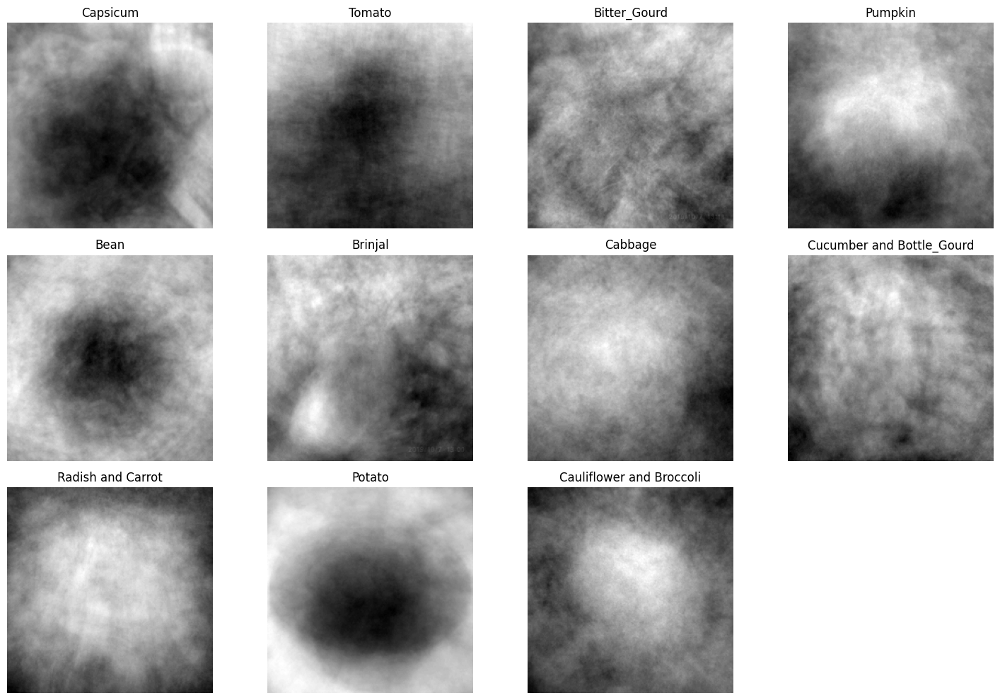

In [ ]:
expected_size = (224, 224)
class_averages = {}

# Loop through each class
for cls_name in os.listdir(dataset_path):
    cls_path = os.path.join(dataset_path, cls_name)

    if os.path.isdir(cls_path):
        images = []
        for img_name in os.listdir(cls_path):
            img_path = os.path.join(cls_path, img_name)
            try:
                img = Image.open(img_path)
                img_array = np.array(img).astype(np.float32)

                # Skip images of wrong size
                if img_array.shape[0:2] != expected_size:
                    continue

                images.append(img_array)
            except Exception as e:
                print(f"Error processing {img_path}: {e}")

        # Only if there are valid images
        if images:
            images = np.stack(images, axis=0)  # Shape: (num_images, height, width, channels)
            avg_image = np.mean(images, axis=0)

            # Convert the average image to grayscale
            gray_avg_image = np.mean(avg_image, axis=2).astype(np.uint8)

            class_averages[cls_name] = gray_avg_image

# Plot the grayscale average image for each class
plt.figure(figsize=(15, 10))

for idx, (cls_name, gray_avg_image) in enumerate(class_averages.items()):
    plt.subplot(3, 4, idx + 1)  # Adjust depending on how many classes you have
    gray_avg_normalized = gray_avg_image / 255.0  # Normalize for visualization
    plt.imshow(gray_avg_normalized, cmap='gray')  # Display in grayscale using cmap='gray'
    plt.title(cls_name)
    plt.axis('off')

plt.tight_layout()
plt.show()

From the following, we can observe:

<br>
<hr>
<br>

### Center Concentration

Most classes (e.g., Tomato, Pumpkin, Cabbage, Cauliflower and Broccoli, Potato) have their **brightest or darkest intensities at the center**, suggesting that the objects are centered in the images across the dataset.

This is typical in datasets where images are preprocessed to center the main object which is **good for CNN training.**

<br>
<hr>
<br>

### Circular Shapes

Some classes like Potato, Tomato, Bean show dark central blobs with fading outer regions, **indicating a rounded, central shape.**

This suggests our model could learn to distinguish these classes based on **circularity**.

<br>
<hr>
<br>

### Textures

Bitter_Gourd, Brinjal, and Radish and Carrot have more textured, noisy, or irregular patterns, possibly due to variation in object shapes or positioning.

These classes may have higher intra-class variation, which might make them harder to classify which can be **useful insights for interpreting confusion matrices later.**


# Data Preprocessing

The following code loads both small and large image datasets for training and validation, ensuring that the images are **preprocessed into batches, resized, shuffled, and ready for model input.**

We also confirm the final shape of the images to verify the resizing process.

In [ ]:
small_train = tf.keras.preprocessing.image_dataset_from_directory(
    "/content/dataset/balanced_train",
    color_mode="grayscale",
    batch_size=32,
    image_size=(23,23), # strictly specified the sizes of the images
    shuffle=True,
    seed=123
)

small_val = tf.keras.preprocessing.image_dataset_from_directory(
    "/content/Dataset for CA1 part A - AY2526S1/validation",
    color_mode="grayscale",
    batch_size=32,
    image_size=(23,23), # strictly specified the sizes of the images
    shuffle=True,
    seed=123
)

large_train = tf.keras.preprocessing.image_dataset_from_directory(
    "/content/dataset/balanced_train",
    color_mode="grayscale",
    batch_size=32,
    image_size=(101,101), # strictly specified the sizes of the images
    shuffle=True,
    seed=123
)

large_val = tf.keras.preprocessing.image_dataset_from_directory(
    "/content/Dataset for CA1 part A - AY2526S1/validation",
    color_mode="grayscale",
    batch_size=32,
    image_size=(101,101), # strictly specified the sizes of the images
    shuffle=True,
    seed=123
)

for batch in small_train.take(1):
    imgs, labels = batch
    print("small:", imgs.shape)

for batch in large_train.take(1):
    imgs, labels = batch
    print("large:", imgs.shape)

Found 10494 files belonging to 11 classes.
Found 2200 files belonging to 11 classes.
Found 10494 files belonging to 11 classes.
Found 2200 files belonging to 11 classes.
small: (32, 23, 23, 1)
large: (32, 101, 101, 1)


## Normalization

In the original images, pixel values typically range from 0 to 255. By normalizing the pixel values by 255.0, we ensure that the input data is standardized, which helps the neural network learn more effectively.

### Why Normalize?

Neural networks generally **perform better and converge faster** when **input values are within a smaller, consistent range**. This process also helps prevent issues with large gradients and makes the training process more stable.

In [ ]:
def normalize_img(image, label):
    return image / 255.0, label

# Apply normalization
small_train = small_train.map(normalize_img)
small_val = small_val.map(normalize_img)

large_train = large_train.map(normalize_img)
large_val = large_val.map(normalize_img)

## Data augmentation

We will have 2 sets of each training sets (23x23 and 101x101, and each with augmentation and no augmentation). Our models will be trained on both augmented and non-augmented data, and see if the augmentation actually provides an improvement in performance. If not, we will continue with the original non-augmented sets.

Our augmentation consists of applying flips, rotations, zooms and make the image brighter or darker randomly.

<br>
<hr>
<br>

### Why data augmentation?

Data augmentation can potentially:

- **Improve generalization.** By augmenting our dataset, we are artificially increasing its size and diversity. This means the model will learn to recognize features in many different contexts.

- **Prevent overfitting.** When we have a small dataset, our model can memorize the specific images in the training set. Data augmentation combats overfitting by providing new versions of the same images, so the model sees a broader range of variations and cannot just memorize pixel values.

<br>
<hr>
<br>

In summary, data augmentation is a powerful technique to make your model **more robust, reduce overfitting, and improve generalization** by **artificially expanding our dataset** with transformations. **Therefore we will be trying out augmentation!**

In [ ]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.1),
    tf.keras.layers.RandomZoom(0.1),
    tf.keras.layers.RandomContrast(0.1),
])

We will visualize an example of what our augmentation does.

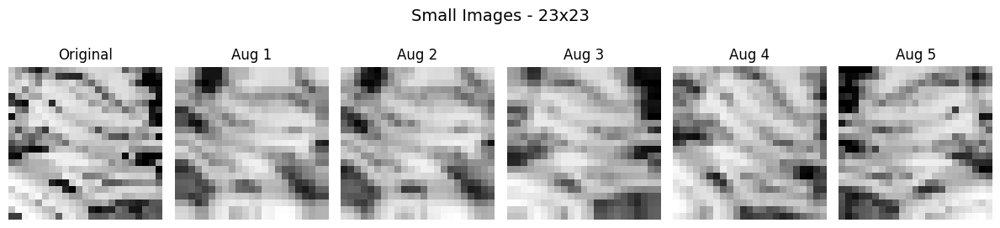

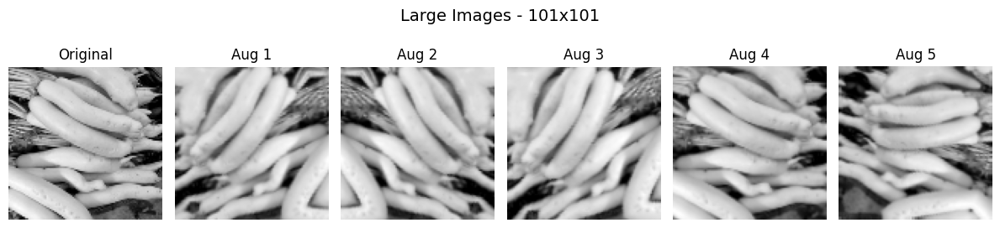

In [ ]:
# Function to display original + augmented samples
def visualize_augmentation(dataset, title, img_size):
    for images, labels in dataset.take(1):
        sample_image = images[0]
        break

    sample_image_batch = tf.expand_dims(sample_image, 0)
    augmented_images = [data_augmentation(sample_image_batch)[0] for _ in range(5)]

    plt.figure(figsize=(12, 3))
    plt.suptitle(f"{title} - {img_size}x{img_size}", fontsize=14)

    plt.subplot(1, 6, 1)
    plt.imshow(sample_image.numpy().squeeze(), cmap="gray")
    plt.title("Original")
    plt.axis("off")

    for i, aug_img in enumerate(augmented_images):
        plt.subplot(1, 6, i+2)
        plt.imshow(aug_img.numpy().squeeze(), cmap="gray")
        plt.title(f"Aug {i+1}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

# Visualize for both datasets
visualize_augmentation(small_train, "Small Images", 23)
visualize_augmentation(large_train, "Large Images", 101)

## AUTOTUNE

AUTOTUNE optimizes data pipeline performance by **dynamically adjusting parallel operations** for data loading and augmentation.

It improves the efficiency of our data pipeline by allowing **parallel data processing, prefetching, and caching, which can dramatically speed up training.**

For tasks involving large datasets and complex transformations (like augmenting images), AUTOTUNE helps avoid bottlenecks and makes better use of our hardware.

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

small_train = small_train.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
small_val = small_val.cache().prefetch(buffer_size=AUTOTUNE)

# Augmented training data
augmented_small_train = (
    small_train
    .map(lambda x, y: (data_augmentation(x, training=True), y), num_parallel_calls=AUTOTUNE)
    .cache()
    .prefetch(buffer_size=AUTOTUNE)
)

large_train = large_train.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
large_val = large_val.cache().prefetch(buffer_size=AUTOTUNE)

# Augmented training data
augmented_large_train = (
    large_train
    .map(lambda x, y: (data_augmentation(x, training=True), y), num_parallel_calls=AUTOTUNE)
    .cache()
    .prefetch(buffer_size=AUTOTUNE)
)

# Model Creation

We will first create dictionaries in order to create a dataframe that displays all models.

We will use this dataframe to rank which models are better or worse, and then further hypertune the best models.

## Let's discuss what models we are going to build:

<br><hr><br>

1. Custom CNN

- Consists of three convolutional blocks with increasing filter depths.

- Uses BatchNormalization after each Conv2D layer to stabilize and accelerate training.

- Dropout (configurable) is used after each block for regularization and overfitting control.

- Uses GlobalAveragePooling2D instead of flattening to reduce parameter count and encourage generalization.

- Ends with a dense classifier (128 units to softmax), suitable for 11-class prediction.

<br><hr><br>

2. VGG-inspired CNN

- Mimics the VGG-style deep architecture using repeated 3x3 convolutional layers.

- Sequential stacking of conv layers per block (32, 64, 128), as per VGG philosophy.

- Employs MaxPooling2D after blocks to downsample spatial dimensions.

- Uses GlobalAveragePooling2D for compression instead of flattening—more modern.

- Final Dense layer: 128 units + Dropout before softmax classifier.

In our "mini-VGG" adaptation we simply reduce the number of pooling layers (or delay them) so we never overcompress the 23x23 or 101x101 input, yet still reap the benefits of VGG's depth and locality bias. We experiment if this method could possibly increase our accuracy.

<br><hr><br>

3. Mini-Resnet-inspired Model

- Starts with a base convolution followed by custom residual blocks.

- Each residual block includes: Two Conv2D layers, BatchNormalization

- Skip (identity) connections to avoid vanishing gradients and encourage gradient flow.

- Employs MaxPooling2D and GlobalAveragePooling2D to reduce computation.

- Final classification layer: Dense(64) + Dropout to softmax.

<br><hr><br>

4. Mobilenet-Lite-inspired model

- Tailored for efficiency: uses SeparableConv2D (depthwise separable convolutions) to drastically reduce parameter count and computation.

- Filter sizes progress from 32, 64, 128 across blocks.

- Each block includes: SeparableConv2D, BatchNormalization, MaxPooling or GlobalAveragePooling.

- Starts with Rescaling layer to normalize input pixels to [0, 1].

- Ends with a compact Dense(64) + Dropout(0.3) to softmax.

<br><hr><br>

5. Mini-Densenet-inspired model

- Begins with a Conv2D layer (16 filters) followed by two Dense Blocks.

- Each Dense Block:

- Contains 3 convolutional layers with growth rate = 12. Uses BatchNormalization to ReLU to Conv2D. Applies feature concatenation from all previous layers (key DenseNet trait).

- Includes MaxPooling2D (1x2) after first block and GlobalAveragePooling2D at the end.

- Final classifier: Dense(64) + Dropout(0.3) to softmax.



### A list of potential metrics that we can use:

- Accuracy <br> It gives us a quick, overall sense of how our model is right. It is also easy to interpret. The only downside is if there is class imbalance, which we already handled.

- Precision <br> A simple way to think is “When the model says this is a carrot, how often is it actually a carrot?”. High precision means few false alarms, which is important if, say, mistaking a toxic flower for an edible vegetable could be dangerous.

- Recall <br> A simple way to think is "Of all the real apples, how many did I actually detect?". Higher recall means fewer misses, which is critical if you need to catch every instance of a minority or safety-critical class.

- F1 Score <br> This balances precision and recall into a single number. This is useful when we want a trade-off between "false alarms" and "misses" without over-penalizing one.

### What metric will we use?

Because we want to give a quick and easy, interpretable comparison for our models, **we will utilize accuracy**. This is because accuracy is the easiest metric to interpret, and the only downside is if there is class imbalance. We already handled class imbalance, hence we do not need to worry about this. In evaluating our best model after hypertuning, we will use all the metrics, so there is no worry.


In [ ]:
# Dictionary to store history from each model
small_history_dict = {}
large_history_dict = {}

## Model callbacks

I used:


- Implemented EarlyStopping during model training to **monitor validation loss and halt training when no further improvement** was observed, thereby **preventing overfitting and conserving computational resources.** I tuned the parameter of `start_from_epoch` to 10 because I want to give all models at least 10 epochs of training before comparison.


- ReduceLROnPlateau to **reduce the learning rate when the model's performance plateaus (i.e., when the validation loss stops improving)**.
It automatically adjusts the learning rate based on the progress, ensuring the model doesn't **"get stuck" with a learning rate that is too high when improvements are minimal.**



In [ ]:
early_stop = tf.keras.callbacks.EarlyStopping(
    patience=3,
    min_delta=0.0005,
    restore_best_weights=True,
    monitor='val_loss',
    start_from_epoch=10
)

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(factor=0.5, patience=3, min_lr=1e-6, verbose=1)

## Dummy Baseline

We will create a dummy model in order to compare how well our models are doing. It has no hidden layers, and it acts like a **simple linear classifier.**

**We can confirm whether our models are actually better than random guessing or naive learning.**

In [ ]:
def dummy_baseline_model(input_shape=(23, 23, 1), num_classes=11):
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=input_shape),
        tf.keras.layers.Flatten(),  # Just flatten the image
        tf.keras.layers.Dense(num_classes, activation='softmax')  # No hidden layers
    ])
    return model

In [ ]:
# ------------------------------Small------------------------------
small_dummy_model = dummy_baseline_model()
small_dummy_model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy'])

small_dummy_model.summary()

# ------------------------------Large------------------------------
large_dummy_model = dummy_baseline_model(input_shape=(101, 101, 1))
large_dummy_model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy'])

large_dummy_model.summary()

Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_19 (Flatten)            │ (None, 529)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 11)             │         5,830 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,830 (22.77 KB)

 Trainable params: 5,830 (22.77 KB)

 Non-trainable params: 0 (0.00 B)

Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_20 (Flatten)            │ (None, 10201)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_32 (Dense)                │ (None, 11)             │       112,222 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 112,222 (438.37 KB)

 Trainable params: 112,222 (438.37 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
small_dummy_history = small_dummy_model.fit(
    small_train,
    validation_data=small_val,
    epochs=20,
    callbacks=[early_stop, reduce_lr]
)

large_dummy_history = large_dummy_model.fit(
    large_train,
    validation_data=large_val,
    epochs=20,
    callbacks=[early_stop, reduce_lr]
)

small_history_dict['Dummy Baseline'] = small_dummy_history.history
large_history_dict['Dummy Baseline'] = large_dummy_history.history

Epoch 1/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.1392 - loss: 2.3757 - val_accuracy: 0.2250 - val_loss: 2.2449 - learning_rate: 0.0010
Epoch 2/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.2396 - loss: 2.1764 - val_accuracy: 0.2168 - val_loss: 2.1897 - learning_rate: 0.0010
Epoch 3/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.2721 - loss: 2.1165 - val_accuracy: 0.2482 - val_loss: 2.1651 - learning_rate: 0.0010
Epoch 4/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.2949 - loss: 2.0747 - val_accuracy: 0.2791 - val_loss: 2.1421 - learning_rate: 0.0010
Epoch 5/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.2986 - loss: 2.0437 - val_accuracy: 0.2941 - val_loss: 2.1319 - learning_rate: 0.0010
Epoch 6/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3127 - loss: 2.0193 - val_accuracy: 0.2895 - val_loss: 2.0913 - learning_rate: 0.0010
Epoch 7/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3192 - loss: 2.0059 - 

In [ ]:
# ------------------------------Small------------------------------
aug_small_dummy_model = dummy_baseline_model()
aug_small_dummy_model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy'])

aug_small_dummy_model.summary()

# ------------------------------Large------------------------------

aug_large_dummy_model = dummy_baseline_model(input_shape=(101, 101, 1))
aug_large_dummy_model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy'])

aug_large_dummy_model.summary()

Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_21 (Flatten)            │ (None, 529)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 11)             │         5,830 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,830 (22.77 KB)

 Trainable params: 5,830 (22.77 KB)

 Non-trainable params: 0 (0.00 B)

Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_22 (Flatten)            │ (None, 10201)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 11)             │       112,222 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 112,222 (438.37 KB)

 Trainable params: 112,222 (438.37 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# ------------------------------Small------------------------------
aug_small_dummy_history = aug_small_dummy_model.fit(
    augmented_small_train,
    validation_data=small_val,
    epochs=20,
    callbacks=[early_stop, reduce_lr]
)

small_history_dict['Dummy Baseline with Augmented Data'] = aug_small_dummy_history.history


# ------------------------------Large-----------------------------
aug_large_dummy_history = aug_large_dummy_model.fit(
    augmented_large_train,
    validation_data=large_val,
    epochs=20,
    callbacks=[early_stop, reduce_lr]
)

large_history_dict['Dummy Baseline with Augmented Data'] = aug_large_dummy_history.history

Epoch 1/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.1344 - loss: 2.3903 - val_accuracy: 0.1632 - val_loss: 2.3076 - learning_rate: 0.0010
Epoch 2/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.1764 - loss: 2.2907 - val_accuracy: 0.1755 - val_loss: 2.2851 - learning_rate: 0.0010
Epoch 3/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.1910 - loss: 2.2652 - val_accuracy: 0.1845 - val_loss: 2.2749 - learning_rate: 0.0010
Epoch 4/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.1998 - loss: 2.2496 - val_accuracy: 0.1914 - val_loss: 2.2691 - learning_rate: 0.0010
Epoch 5/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.2076 - loss: 2.2383 - val_accuracy: 0.1968 - val_loss: 2.2654 - learning_rate: 0.0010
Epoch 6/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.2134 - loss: 2.2292 - val_accuracy: 0.1991 - val_loss: 2.2628 - learning_rate: 0.0010
Epoch 7/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.2169 - loss: 2.2214 - 

Our dummy training accuracy is around 0.35, and validation accuracy 0.29, hence we will use this to compare to our other models.

We did a quick comparison on how the dummy model performed on augmented data, and it performed worse, with a training accuracy of 0.23, and a validation accuracy of 0.20.

## 1. Custom CNN

1. Custom CNN

- Consists of three convolutional blocks with increasing filter depths.

- Uses BatchNormalization after each Conv2D layer to stabilize and accelerate training.

- Dropout (configurable) is used after each block for regularization and overfitting control.

- Uses GlobalAveragePooling2D instead of flattening to reduce parameter count and encourage generalization.

- Ends with a dense classifier (128 units to softmax), suitable for 11-class prediction.

In [ ]:
def custom_cnn(input_shape=(23, 23, 1), num_classes=11,
               dropout_rate=0.5,
               filters_block1=32,
               filters_block2=64,
               dense_units=128):
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=input_shape),

        # Block 1
        tf.keras.layers.Conv2D(filters_block1, (3, 3), activation='relu', padding='same'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2D(filters_block1, (3, 3), activation='relu', padding='same'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dropout(dropout_rate),

        # Block 2 + Pooling
        tf.keras.layers.Conv2D(filters_block2, (3, 3), activation='relu', padding='same'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2D(filters_block2, (3, 3), activation='relu', padding='same'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
        tf.keras.layers.Dropout(dropout_rate),

        # Block 3
        tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dropout(dropout_rate),

        # Classifier
        tf.keras.layers.GlobalAveragePooling2D(),
        tf.keras.layers.Dense(dense_units, activation='relu'),
        tf.keras.layers.Dropout(dropout_rate),
        tf.keras.layers.Dense(num_classes, activation='softmax')
    ])
    return model

In [ ]:
# ------------------------------Small------------------------------
small_cnn = custom_cnn()
small_cnn.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

small_cnn.summary()


# ------------------------------Large------------------------------
large_cnn = custom_cnn(input_shape=(101, 101, 1))
large_cnn.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

large_cnn.summary()

Model: "sequential_42"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_160 (Conv2D)             │ (None, 23, 23, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_124         │ (None, 23, 23, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_161 (Conv2D)             │ (None, 23, 23, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_125         │ (None, 23, 23, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_54 (Dropout)            │ (None, 23, 23, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_162 (Conv2D)             │ (None, 23, 23, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_126         │ (None, 23, 23, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_163 (Conv2D)             │ (None, 23, 23, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_127         │ (None, 23, 23, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_40 (MaxPooling2D) │ (None, 11, 11, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_55 (Dropout)            │ (None, 11, 11, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_164 (Conv2D)             │ (None, 11, 11, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_128         │ (None, 11, 11, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_165 (Conv2D)             │ (None, 11, 11, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_129         │ (None, 11, 11, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_56 (Dropout)            │ (None, 11, 11, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_30     │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_57 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_84 (Dense)                │ (None, 11)             │         1,419 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 306,155 (1.17 MB)

 Trainable params: 305,259 (1.16 MB)

 Non-trainable params: 896 (3.50 KB)

Model: "sequential_43"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_166 (Conv2D)             │ (None, 101, 101, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_130         │ (None, 101, 101, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_167 (Conv2D)             │ (None, 101, 101, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_131         │ (None, 101, 101, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_58 (Dropout)            │ (None, 101, 101, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_168 (Conv2D)             │ (None, 101, 101, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_132         │ (None, 101, 101, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_169 (Conv2D)             │ (None, 101, 101, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_133         │ (None, 101, 101, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_41 (MaxPooling2D) │ (None, 50, 50, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_59 (Dropout)            │ (None, 50, 50, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_170 (Conv2D)             │ (None, 50, 50, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_134         │ (None, 50, 50, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_171 (Conv2D)             │ (None, 50, 50, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_135         │ (None, 50, 50, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_60 (Dropout)            │ (None, 50, 50, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_31     │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_61 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 11)             │         1,419 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 306,155 (1.17 MB)

 Trainable params: 305,259 (1.16 MB)

 Non-trainable params: 896 (3.50 KB)

In [ ]:
# ------------------------------Small------------------------------
small_cnn_history = small_cnn.fit(
    small_train,
    validation_data=small_val,
    epochs=20,
    callbacks=[early_stop, reduce_lr]
)

small_history_dict['Custom CNN'] = small_cnn_history.history

# ------------------------------Large------------------------------
large_cnn_history = large_cnn.fit(
    large_train,
    validation_data=large_val,
    epochs=20,
    callbacks=[early_stop, reduce_lr]
)

large_history_dict['Custom CNN'] = large_cnn_history.history

Epoch 1/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - accuracy: 0.2545 - loss: 2.1011 - val_accuracy: 0.1382 - val_loss: 6.2379 - learning_rate: 0.0010
Epoch 2/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.5043 - loss: 1.4389 - val_accuracy: 0.5141 - val_loss: 1.4404 - learning_rate: 0.0010
Epoch 3/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.6197 - loss: 1.1241 - val_accuracy: 0.6441 - val_loss: 1.0432 - learning_rate: 0.0010
Epoch 4/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.6778 - loss: 0.9443 - val_accuracy: 0.6355 - val_loss: 1.2838 - learning_rate: 0.0010
Epoch 5/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.7387 - loss: 0.7848 - val_accuracy: 0.6841 - val_loss: 0.9091 - learning_rate: 0.0010
Epoch 6/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.7774 - loss: 0.6708 - val_accuracy: 0.8109 - val_loss: 0.5668 - learning_rate: 0.0010
Epoch 7/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.8002 - loss: 0.6115 

In [ ]:
# ------------------------------Small------------------------------
aug_small_cnn = custom_cnn()
aug_small_cnn.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

aug_small_cnn.summary()

# ------------------------------Large------------------------------
aug_large_cnn = custom_cnn(input_shape=(101, 101, 1))
aug_large_cnn.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

aug_large_cnn.summary()


Model: "sequential_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_48 (Conv2D)              │ (None, 23, 23, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_36          │ (None, 23, 23, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_49 (Conv2D)              │ (None, 23, 23, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_37          │ (None, 23, 23, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_26 (Dropout)            │ (None, 23, 23, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_50 (Conv2D)              │ (None, 23, 23, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_38          │ (None, 23, 23, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_51 (Conv2D)              │ (None, 23, 23, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_39          │ (None, 23, 23, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 11, 11, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_27 (Dropout)            │ (None, 11, 11, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_52 (Conv2D)              │ (None, 11, 11, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_40          │ (None, 11, 11, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_53 (Conv2D)              │ (None, 11, 11, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_41          │ (None, 11, 11, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_28 (Dropout)            │ (None, 11, 11, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_8      │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_29 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_40 (Dense)                │ (None, 11)             │         1,419 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 306,155 (1.17 MB)

 Trainable params: 305,259 (1.16 MB)

 Non-trainable params: 896 (3.50 KB)

Model: "sequential_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_54 (Conv2D)              │ (None, 101, 101, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_42          │ (None, 101, 101, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_55 (Conv2D)              │ (None, 101, 101, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_43          │ (None, 101, 101, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_30 (Dropout)            │ (None, 101, 101, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_56 (Conv2D)              │ (None, 101, 101, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_44          │ (None, 101, 101, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_57 (Conv2D)              │ (None, 101, 101, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_45          │ (None, 101, 101, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 50, 50, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_31 (Dropout)            │ (None, 50, 50, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_58 (Conv2D)              │ (None, 50, 50, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_46          │ (None, 50, 50, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_59 (Conv2D)              │ (None, 50, 50, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_47          │ (None, 50, 50, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_32 (Dropout)            │ (None, 50, 50, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_9      │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_33 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_42 (Dense)                │ (None, 11)             │         1,419 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 306,155 (1.17 MB)

 Trainable params: 305,259 (1.16 MB)

 Non-trainable params: 896 (3.50 KB)

In [ ]:
# ------------------------------Small------------------------------
aug_small_cnn_history = aug_small_cnn.fit(
    augmented_small_train,
    validation_data=small_val,
    epochs=20,
    callbacks=[early_stop, reduce_lr]
)

small_history_dict['Custom CNN with Augmented Data'] = aug_small_cnn_history.history

# ------------------------------Large------------------------------
aug_large_cnn_history = aug_large_cnn.fit(
    augmented_large_train,
    validation_data=large_val,
    epochs=20,
    callbacks=[early_stop, reduce_lr]
)

large_history_dict['Custom CNN with Augmented Data'] = aug_large_cnn_history.history

Epoch 1/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - accuracy: 0.2246 - loss: 2.1962 - val_accuracy: 0.0836 - val_loss: 6.3724 - learning_rate: 0.0010
Epoch 2/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.3892 - loss: 1.7874 - val_accuracy: 0.4377 - val_loss: 1.7344 - learning_rate: 0.0010
Epoch 3/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.4878 - loss: 1.4998 - val_accuracy: 0.3182 - val_loss: 2.0995 - learning_rate: 0.0010
Epoch 4/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.5421 - loss: 1.3568 - val_accuracy: 0.3200 - val_loss: 2.6029 - learning_rate: 0.0010
Epoch 5/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.5839 - loss: 1.2419 - val_accuracy: 0.4868 - val_loss: 1.6488 - learning_rate: 0.0010
Epoch 6/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.6251 - loss: 1.1129 - val_accuracy: 0.5114 - val_loss: 1.5459 - learning_rate: 0.0010
Epoch 7/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.6454 - loss: 1.0462 

We noticed that for our custom CNN, the model performed worse on the augmented dataset.

## 2. VGG-inspired CNN


2. VGG-inspired CNN

- Mimics the VGG-style deep architecture using repeated 3x3 convolutional layers.

- Sequential stacking of conv layers per block (32, 64, 128), as per VGG philosophy.

- Employs MaxPooling2D after blocks to downsample spatial dimensions.

- Uses GlobalAveragePooling2D for compression instead of flattening—more modern.

- Final Dense layer: 128 units + Dropout before softmax classifier.

In [ ]:
def vgg_model(input_shape=(23, 23, 1), num_classes=11):
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=input_shape),

        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
        tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
        tf.keras.layers.MaxPooling2D(pool_size=(1, 2)),

        tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
        tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
        tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),

        tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
        tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
        tf.keras.layers.GlobalAveragePooling2D(),

        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(num_classes, activation='softmax')
    ])
    return model

In [ ]:
# ------------------------------Small------------------------------
small_vgg = vgg_model()
small_vgg.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])
small_vgg.summary()

# ------------------------------Large------------------------------
large_vgg = vgg_model(input_shape=(101, 101, 1))
large_vgg.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])
large_vgg.summary()


Model: "sequential_44"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_172 (Conv2D)             │ (None, 23, 23, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_173 (Conv2D)             │ (None, 23, 23, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_42 (MaxPooling2D) │ (None, 23, 11, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_174 (Conv2D)             │ (None, 23, 11, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_175 (Conv2D)             │ (None, 23, 11, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_43 (MaxPooling2D) │ (None, 11, 5, 64)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_176 (Conv2D)             │ (None, 11, 5, 128)     │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_177 (Conv2D)             │ (None, 11, 5, 128)     │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_32     │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_87 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_62 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_88 (Dense)                │ (None, 11)             │         1,419 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 304,363 (1.16 MB)

 Trainable params: 304,363 (1.16 MB)

 Non-trainable params: 0 (0.00 B)

Model: "sequential_45"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_178 (Conv2D)             │ (None, 101, 101, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_179 (Conv2D)             │ (None, 101, 101, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_44 (MaxPooling2D) │ (None, 101, 50, 32)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_180 (Conv2D)             │ (None, 101, 50, 64)    │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_181 (Conv2D)             │ (None, 101, 50, 64)    │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_45 (MaxPooling2D) │ (None, 50, 25, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_182 (Conv2D)             │ (None, 50, 25, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_183 (Conv2D)             │ (None, 50, 25, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_33     │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_89 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_63 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_90 (Dense)                │ (None, 11)             │         1,419 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 304,363 (1.16 MB)

 Trainable params: 304,363 (1.16 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# ------------------------------Small------------------------------
small_vgg_history = small_vgg.fit(
    small_train,
    validation_data=small_val,
    epochs=20,
    callbacks=[early_stop, reduce_lr]
)

small_history_dict['VGG'] = small_vgg_history.history


# ------------------------------Large------------------------------
large_vgg_history = large_vgg.fit(
    large_train,
    validation_data=large_val,
    epochs=20,
    callbacks=[early_stop, reduce_lr]
)

large_history_dict['VGG'] = large_vgg_history.history

Epoch 1/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 8s 12ms/step - accuracy: 0.0937 - loss: 2.3984 - val_accuracy: 0.1082 - val_loss: 2.3728 - learning_rate: 0.0010
Epoch 2/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.1666 - loss: 2.2724 - val_accuracy: 0.2264 - val_loss: 2.1362 - learning_rate: 0.0010
Epoch 3/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.2917 - loss: 1.9686 - val_accuracy: 0.3050 - val_loss: 1.9496 - learning_rate: 0.0010
Epoch 4/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.3639 - loss: 1.8303 - val_accuracy: 0.4400 - val_loss: 1.6719 - learning_rate: 0.0010
Epoch 5/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.4139 - loss: 1.6880 - val_accuracy: 0.4409 - val_loss: 1.6270 - learning_rate: 0.0010
Epoch 6/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.4706 - loss: 1.5812 - val_accuracy: 0.4509 - val_loss: 1.5683 - learning_rate: 0.0010
Epoch 7/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.5217 - loss: 1.4351 -

In [ ]:
# ------------------------------Small------------------------------
aug_small_vgg = vgg_model()
aug_small_vgg.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

aug_small_vgg.summary()


# ------------------------------Large------------------------------
aug_large_vgg = vgg_model(input_shape=(101, 101, 1))
aug_large_vgg.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

aug_large_vgg.summary()

Model: "sequential_46"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_184 (Conv2D)             │ (None, 23, 23, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_185 (Conv2D)             │ (None, 23, 23, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_46 (MaxPooling2D) │ (None, 23, 11, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_186 (Conv2D)             │ (None, 23, 11, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_187 (Conv2D)             │ (None, 23, 11, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_47 (MaxPooling2D) │ (None, 11, 5, 64)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_188 (Conv2D)             │ (None, 11, 5, 128)     │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_189 (Conv2D)             │ (None, 11, 5, 128)     │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_34     │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_91 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_64 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_92 (Dense)                │ (None, 11)             │         1,419 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 304,363 (1.16 MB)

 Trainable params: 304,363 (1.16 MB)

 Non-trainable params: 0 (0.00 B)

Model: "sequential_47"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_190 (Conv2D)             │ (None, 101, 101, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_191 (Conv2D)             │ (None, 101, 101, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_48 (MaxPooling2D) │ (None, 101, 50, 32)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_192 (Conv2D)             │ (None, 101, 50, 64)    │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_193 (Conv2D)             │ (None, 101, 50, 64)    │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_49 (MaxPooling2D) │ (None, 50, 25, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_194 (Conv2D)             │ (None, 50, 25, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_195 (Conv2D)             │ (None, 50, 25, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_35     │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_93 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_65 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_94 (Dense)                │ (None, 11)             │         1,419 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 304,363 (1.16 MB)

 Trainable params: 304,363 (1.16 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# ------------------------------Small------------------------------
aug_small_vgg_history = aug_small_vgg.fit(
    augmented_small_train,
    validation_data=small_val,
    epochs=20,
    callbacks=[early_stop, reduce_lr]
)

small_history_dict['VGG with Augmented Data'] = aug_small_vgg_history.history


# ------------------------------Large------------------------------
aug_large_vgg_history = aug_large_vgg.fit(
    augmented_large_train,
    validation_data=large_val,
    epochs=20,
    callbacks=[early_stop, reduce_lr]
)

large_history_dict['VGG with Augmented Data'] = aug_large_vgg_history.history

Epoch 1/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.0902 - loss: 2.3988 - val_accuracy: 0.0818 - val_loss: 2.3971 - learning_rate: 0.0010
Epoch 2/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.1367 - loss: 2.3392 - val_accuracy: 0.1791 - val_loss: 2.2224 - learning_rate: 0.0010
Epoch 3/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.1780 - loss: 2.2512 - val_accuracy: 0.2095 - val_loss: 2.1647 - learning_rate: 0.0010
Epoch 4/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.2134 - loss: 2.2164 - val_accuracy: 0.2986 - val_loss: 2.0657 - learning_rate: 0.0010
Epoch 5/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.2606 - loss: 2.1261 - val_accuracy: 0.3214 - val_loss: 1.9577 - learning_rate: 0.0010
Epoch 6/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.2844 - loss: 2.0557 - val_accuracy: 0.3109 - val_loss: 2.0132 - learning_rate: 0.0010
Epoch 7/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.3036 - loss: 1.9854 -

Again, we noticed that the model performed significantly worse when feeded with augmented data.

## 3. Mini-Resnet-inspired Model

3. Mini-Resnet-inspired Model

- Starts with a base convolution followed by custom residual blocks.

- Each residual block includes: Two Conv2D layers, BatchNormalization

- Skip (identity) connections to avoid vanishing gradients and encourage gradient flow.

- Employs MaxPooling2D and GlobalAveragePooling2D to reduce computation.

- Final classification layer: Dense(64) + Dropout to softmax.

In [ ]:
def residual_block(x, filters):
    shortcut = x
    x = tf.keras.layers.Conv2D(filters, (3, 3), padding='same', activation='relu')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Conv2D(filters, (3, 3), padding='same')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Add()([x, shortcut])
    x = tf.keras.layers.Activation('relu')(x)
    return x



def mini_resnet(input_shape=(23, 23, 1), num_classes=11):
    inputs = tf.keras.Input(shape=input_shape)
    x = tf.keras.layers.Conv2D(32, (3, 3), padding='same', activation='relu')(inputs)
    x = tf.keras.layers.BatchNormalization()(x)

    x = residual_block(x, 32)
    x = tf.keras.layers.MaxPooling2D(pool_size=(1, 2))(x)

    x = tf.keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu')(x)
    x = residual_block(x, 64)
    x = tf.keras.layers.GlobalAveragePooling2D()(x)

    x = tf.keras.layers.Dense(64, activation='relu')(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    outputs = tf.keras.layers.Dense(num_classes, activation='softmax')(x)

    return tf.keras.Model(inputs, outputs)


In [ ]:
# ------------------------------Small------------------------------
small_resnet_model = mini_resnet()
small_resnet_model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

small_resnet_model.summary()

# ------------------------------Large------------------------------
large_resnet_model = mini_resnet(input_shape=(101, 101, 1))
large_resnet_model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

large_resnet_model.summary()

Model: "functional_50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_50      │ (None, 23, 23, 1) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_136 (Conv2D) │ (None, 23, 23,    │        320 │ input_layer_50[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 23, 23,    │        128 │ conv2d_136[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_137 (Conv2D) │ (None, 23, 23,    │      9,248 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 23, 23,    │        128 │ conv2d_137[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_138 (Conv2D) │ (None, 23, 23,    │      9,248 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 23, 23,    │        128 │ conv2d_138[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_8 (Add)         │ (None, 23, 23,    │          0 │ batch_normalizat… │
│                     │ 32)               │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_8        │ (None, 23, 23,    │          0 │ add_8[0][0]       │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_36    │ (None, 23, 11,    │          0 │ activation_8[0][… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_139 (Conv2D) │ (None, 23, 11,    │     18,496 │ max_pooling2d_36… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_140 (Conv2D) │ (None, 23, 11,    │     36,928 │ conv2d_139[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 23, 11,    │        256 │ conv2d_140[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_141 (Conv2D) │ (None, 23, 11,    │     36,928 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 23, 11,    │        256 │ conv2d_141[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_9 (Add)         │ (None, 23, 11,    │          0 │ batch_normalizat… │
│                     │ 64)               │            │ conv2d_139[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_9        │ (None, 23, 11,    │          0 │ add_9[0][0]     

 Total params: 116,939 (456.79 KB)

 Trainable params: 116,491 (455.04 KB)

 Non-trainable params: 448 (1.75 KB)

Model: "functional_51"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_51      │ (None, 101, 101,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_142 (Conv2D) │ (None, 101, 101,  │        320 │ input_layer_51[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 101, 101,  │        128 │ conv2d_142[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_143 (Conv2D) │ (None, 101, 101,  │      9,248 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 101, 101,  │        128 │ conv2d_143[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_144 (Conv2D) │ (None, 101, 101,  │      9,248 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 101, 101,  │        128 │ conv2d_144[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_10 (Add)        │ (None, 101, 101,  │          0 │ batch_normalizat… │
│                     │ 32)               │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_10       │ (None, 101, 101,  │          0 │ add_10[0][0]      │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_37    │ (None, 101, 50,   │          0 │ activation_10[0]… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_145 (Conv2D) │ (None, 101, 50,   │     18,496 │ max_pooling2d_37… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_146 (Conv2D) │ (None, 101, 50,   │     36,928 │ conv2d_145[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 101, 50,   │        256 │ conv2d_146[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_147 (Conv2D) │ (None, 101, 50,   │     36,928 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 101, 50,   │        256 │ conv2d_147[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_11 (Add)        │ (None, 101, 50,   │          0 │ batch_normalizat… │
│                     │ 64)               │            │ conv2d_145[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_11       │ (None, 101, 50,   │          0 │ add_11[0][0]    

 Total params: 116,939 (456.79 KB)

 Trainable params: 116,491 (455.04 KB)

 Non-trainable params: 448 (1.75 KB)

In [ ]:
# ------------------------------Small------------------------------
small_resnet_history = small_resnet_model.fit(
    small_train,
    validation_data=small_val,
    epochs=20,
    callbacks=[early_stop, reduce_lr]
)

small_history_dict['ResNet50'] = small_resnet_history.history

# ------------------------------Large------------------------------
large_resnet_history = large_resnet_model.fit(
    large_train,
    validation_data=large_val,
    epochs=20,
    callbacks=[early_stop, reduce_lr]
)

large_history_dict['ResNet50'] = large_resnet_history.history

Epoch 1/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 14s 17ms/step - accuracy: 0.2208 - loss: 2.2043 - val_accuracy: 0.0909 - val_loss: 4.3744 - learning_rate: 0.0010
Epoch 2/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.4300 - loss: 1.6250 - val_accuracy: 0.2655 - val_loss: 2.8556 - learning_rate: 0.0010
Epoch 3/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.5792 - loss: 1.2778 - val_accuracy: 0.5591 - val_loss: 1.2504 - learning_rate: 0.0010
Epoch 4/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.6611 - loss: 1.0438 - val_accuracy: 0.4414 - val_loss: 1.8652 - learning_rate: 0.0010
Epoch 5/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.7213 - loss: 0.8762 - val_accuracy: 0.6573 - val_loss: 1.0443 - learning_rate: 0.0010
Epoch 6/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.7715 - loss: 0.7279 - val_accuracy: 0.6305 - val_loss: 1.0817 - learning_rate: 0.0010
Epoch 7/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.7905 - loss: 0.6701 

In [ ]:
# ------------------------------Small------------------------------
aug_small_resnet_model = mini_resnet()
aug_small_resnet_model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

aug_small_resnet_model.summary()


# ------------------------------Large------------------------------
aug_large_resnet_model = mini_resnet(input_shape=(101, 101, 1))
aug_large_resnet_model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

aug_large_resnet_model.summary()

Model: "functional_52"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_52      │ (None, 23, 23, 1) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_148 (Conv2D) │ (None, 23, 23,    │        320 │ input_layer_52[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 23, 23,    │        128 │ conv2d_148[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_149 (Conv2D) │ (None, 23, 23,    │      9,248 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 23, 23,    │        128 │ conv2d_149[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_150 (Conv2D) │ (None, 23, 23,    │      9,248 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 23, 23,    │        128 │ conv2d_150[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_12 (Add)        │ (None, 23, 23,    │          0 │ batch_normalizat… │
│                     │ 32)               │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_12       │ (None, 23, 23,    │          0 │ add_12[0][0]      │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_38    │ (None, 23, 11,    │          0 │ activation_12[0]… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_151 (Conv2D) │ (None, 23, 11,    │     18,496 │ max_pooling2d_38… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_152 (Conv2D) │ (None, 23, 11,    │     36,928 │ conv2d_151[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 23, 11,    │        256 │ conv2d_152[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_153 (Conv2D) │ (None, 23, 11,    │     36,928 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 23, 11,    │        256 │ conv2d_153[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_13 (Add)        │ (None, 23, 11,    │          0 │ batch_normalizat… │
│                     │ 64)               │            │ conv2d_151[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_13       │ (None, 23, 11,    │          0 │ add_13[0][0]    

 Total params: 116,939 (456.79 KB)

 Trainable params: 116,491 (455.04 KB)

 Non-trainable params: 448 (1.75 KB)

Model: "functional_53"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_53      │ (None, 101, 101,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_154 (Conv2D) │ (None, 101, 101,  │        320 │ input_layer_53[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 101, 101,  │        128 │ conv2d_154[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_155 (Conv2D) │ (None, 101, 101,  │      9,248 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 101, 101,  │        128 │ conv2d_155[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_156 (Conv2D) │ (None, 101, 101,  │      9,248 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 101, 101,  │        128 │ conv2d_156[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_14 (Add)        │ (None, 101, 101,  │          0 │ batch_normalizat… │
│                     │ 32)               │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_14       │ (None, 101, 101,  │          0 │ add_14[0][0]      │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_39    │ (None, 101, 50,   │          0 │ activation_14[0]… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_157 (Conv2D) │ (None, 101, 50,   │     18,496 │ max_pooling2d_39… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_158 (Conv2D) │ (None, 101, 50,   │     36,928 │ conv2d_157[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 101, 50,   │        256 │ conv2d_158[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_159 (Conv2D) │ (None, 101, 50,   │     36,928 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 101, 50,   │        256 │ conv2d_159[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_15 (Add)        │ (None, 101, 50,   │          0 │ batch_normalizat… │
│                     │ 64)               │            │ conv2d_157[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_15       │ (None, 101, 50,   │          0 │ add_15[0][0]    

 Total params: 116,939 (456.79 KB)

 Trainable params: 116,491 (455.04 KB)

 Non-trainable params: 448 (1.75 KB)

In [ ]:
# ------------------------------Small------------------------------
aug_small_resnet_history = aug_small_resnet_model.fit(
    small_train,
    validation_data=small_val,
    epochs=20,
    callbacks=[early_stop, reduce_lr]
)

small_history_dict['ResNet50 with Augmented Data'] = aug_small_resnet_history.history  # Save training history


# ------------------------------Large------------------------------
aug_large_resnet_history = aug_large_resnet_model.fit(
    large_train,
    validation_data=large_val,
    epochs=20,
    callbacks=[early_stop, reduce_lr]
)

large_history_dict['ResNet50 with Augmented Data'] = aug_large_resnet_history.history  # Save training history

Epoch 1/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - accuracy: 0.2185 - loss: 2.1924 - val_accuracy: 0.0909 - val_loss: 12.4494 - learning_rate: 0.0010
Epoch 2/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.4811 - loss: 1.5481 - val_accuracy: 0.3559 - val_loss: 1.8525 - learning_rate: 0.0010
Epoch 3/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.6027 - loss: 1.1984 - val_accuracy: 0.5005 - val_loss: 1.6080 - learning_rate: 0.0010
Epoch 4/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.6699 - loss: 0.9985 - val_accuracy: 0.4464 - val_loss: 1.7087 - learning_rate: 0.0010
Epoch 5/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.7331 - loss: 0.8312 - val_accuracy: 0.5895 - val_loss: 1.1781 - learning_rate: 0.0010
Epoch 6/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.7813 - loss: 0.6913 - val_accuracy: 0.6277 - val_loss: 1.3663 - learning_rate: 0.0010
Epoch 7/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.8091 - loss: 0.5971

## 4. Mobilenet-Lite-inspired model

4. Mobilenet-Lite-inspired model

- Tailored for efficiency: uses SeparableConv2D (depthwise separable convolutions) to drastically reduce parameter count and computation.

- Filter sizes progress from 32, 64, 128 across blocks.

- Each block includes: SeparableConv2D, BatchNormalization, MaxPooling or GlobalAveragePooling.

- Starts with Rescaling layer to normalize input pixels to [0, 1].

- Ends with a compact Dense(64) + Dropout(0.3) to softmax.

In [ ]:
def mobilenet_lite(input_shape=(23, 23, 1), num_classes=11):
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=input_shape),
        tf.keras.layers.Rescaling(1./255),

        tf.keras.layers.SeparableConv2D(32, (3, 3), padding='same', activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D(pool_size=(1, 2)),

        tf.keras.layers.SeparableConv2D(64, (3, 3), padding='same', activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),

        tf.keras.layers.SeparableConv2D(128, (3, 3), padding='same', activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.GlobalAveragePooling2D(),

        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Dense(num_classes, activation='softmax')
    ])
    return model

In [ ]:
# ------------------------------Small------------------------------
small_mobilenet_model = mobilenet_lite()
small_mobilenet_model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

small_mobilenet_model.summary()


# ------------------------------Large------------------------------
large_mobilenet_model = mobilenet_lite(input_shape=(101, 101, 1))
large_mobilenet_model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

large_mobilenet_model.summary()

Model: "sequential_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)           │ (None, 23, 23, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d                │ (None, 23, 23, 32)     │            73 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_68          │ (None, 23, 23, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_24 (MaxPooling2D) │ (None, 23, 11, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_1              │ (None, 23, 11, 64)     │         2,400 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_69          │ (None, 23, 11, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_25 (MaxPooling2D) │ (None, 11, 5, 64)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_2              │ (None, 11, 5, 128)     │         8,896 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_70          │ (None, 11, 5, 128)     │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_18     │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_42 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_60 (Dense)                │ (None, 11)             │           715 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,236 (82.95 KB)

 Trainable params: 20,788 (81.20 KB)

 Non-trainable params: 448 (1.75 KB)

Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_1 (Rescaling)         │ (None, 101, 101, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_3              │ (None, 101, 101, 32)   │            73 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_71          │ (None, 101, 101, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_26 (MaxPooling2D) │ (None, 101, 50, 32)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_4              │ (None, 101, 50, 64)    │         2,400 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_72          │ (None, 101, 50, 64)    │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_27 (MaxPooling2D) │ (None, 50, 25, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_5              │ (None, 50, 25, 128)    │         8,896 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_73          │ (None, 50, 25, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_19     │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_43 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 11)             │           715 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,236 (82.95 KB)

 Trainable params: 20,788 (81.20 KB)

 Non-trainable params: 448 (1.75 KB)

In [ ]:
# ------------------------------Small------------------------------
small_mobilenet_history = small_mobilenet_model.fit(
    small_train,
    validation_data=small_val,
    epochs=20,
    callbacks=[early_stop, reduce_lr]
)

small_history_dict['MobileNet'] = small_mobilenet_history.history


# ------------------------------Large------------------------------
large_mobilenet_history = large_mobilenet_model.fit(
    large_train,
    validation_data=large_val,
    epochs=20,
    callbacks=[early_stop, reduce_lr]
)

large_history_dict['MobileNet'] = large_mobilenet_history.history

Epoch 1/30
328/328 ━━━━━━━━━━━━━━━━━━━━ 12s 16ms/step - accuracy: 0.2149 - loss: 2.2140 - val_accuracy: 0.0909 - val_loss: 2.4556 - learning_rate: 0.0010
Epoch 2/30
328/328 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.3719 - loss: 1.7944 - val_accuracy: 0.1182 - val_loss: 2.6646 - learning_rate: 0.0010
Epoch 3/30
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.4593 - loss: 1.5753 - val_accuracy: 0.2095 - val_loss: 2.9365 - learning_rate: 0.0010
Epoch 4/30
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.5228 - loss: 1.3817 - val_accuracy: 0.2432 - val_loss: 2.3082 - learning_rate: 0.0010
Epoch 5/30
328/328 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5737 - loss: 1.2547 - val_accuracy: 0.3391 - val_loss: 2.3796 - learning_rate: 0.0010
Epoch 6/30
328/328 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5959 - loss: 1.1978 - val_accuracy: 0.1314 - val_loss: 7.8764 - learning_rate: 0.0010
Epoch 7/30
319/328 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6278 - loss: 1.1042


In [ ]:
# ------------------------------Small------------------------------
aug_small_mobilenet_model = mobilenet_lite()
aug_small_mobilenet_model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

aug_small_mobilenet_model.summary()

# ------------------------------Large------------------------------
aug_large_mobilenet_model = mobilenet_lite(input_shape=(101, 101, 1))
aug_large_mobilenet_model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

aug_large_mobilenet_model.summary()

Model: "sequential_40"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_2 (Rescaling)         │ (None, 23, 23, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_6              │ (None, 23, 23, 32)     │            73 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_74          │ (None, 23, 23, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_28 (MaxPooling2D) │ (None, 23, 11, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_7              │ (None, 23, 11, 64)     │         2,400 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_75          │ (None, 23, 11, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_29 (MaxPooling2D) │ (None, 11, 5, 64)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_8              │ (None, 11, 5, 128)     │         8,896 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_76          │ (None, 11, 5, 128)     │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_20     │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_63 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_44 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_64 (Dense)                │ (None, 11)             │           715 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,236 (82.95 KB)

 Trainable params: 20,788 (81.20 KB)

 Non-trainable params: 448 (1.75 KB)

Model: "sequential_41"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_3 (Rescaling)         │ (None, 101, 101, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_9              │ (None, 101, 101, 32)   │            73 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_77          │ (None, 101, 101, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_30 (MaxPooling2D) │ (None, 101, 50, 32)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_10             │ (None, 101, 50, 64)    │         2,400 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_78          │ (None, 101, 50, 64)    │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_31 (MaxPooling2D) │ (None, 50, 25, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ separable_conv2d_11             │ (None, 50, 25, 128)    │         8,896 │
│ (SeparableConv2D)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_79          │ (None, 50, 25, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_21     │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_45 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 11)             │           715 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,236 (82.95 KB)

 Trainable params: 20,788 (81.20 KB)

 Non-trainable params: 448 (1.75 KB)

In [ ]:
# ------------------------------Small------------------------------
aug_small_mobilenet_history = aug_small_mobilenet_model.fit(
    small_train,
    validation_data=small_val,
    epochs=20,
    callbacks=[early_stop, reduce_lr]
)

small_history_dict['MobileNet with Augmented Data'] = aug_small_mobilenet_history.history


# ------------------------------Large------------------------------
aug_large_mobilenet_history = aug_large_mobilenet_model.fit(
    large_train,
    validation_data=large_val,
    epochs=20,
    callbacks=[early_stop, reduce_lr]
)

large_history_dict['MobileNet with Augmented Data'] = aug_large_mobilenet_history.history

Epoch 1/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 10s 16ms/step - accuracy: 0.2225 - loss: 2.1902 - val_accuracy: 0.0909 - val_loss: 2.4308 - learning_rate: 0.0010
Epoch 2/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.3473 - loss: 1.8656 - val_accuracy: 0.1150 - val_loss: 4.0065 - learning_rate: 0.0010
Epoch 3/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4346 - loss: 1.6383 - val_accuracy: 0.2936 - val_loss: 2.3334 - learning_rate: 0.0010
Epoch 4/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4884 - loss: 1.4905 - val_accuracy: 0.2114 - val_loss: 4.8738 - learning_rate: 0.0010
Epoch 5/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5347 - loss: 1.3611 - val_accuracy: 0.1623 - val_loss: 4.5721 - learning_rate: 0.0010
Epoch 6/20
321/328 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5648 - loss: 1.2729
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.5650 - loss: 1.2726 -

## 5. Mini-Densenet-inspired model

5. Mini-Densenet-inspired model

- Begins with a Conv2D layer (16 filters) followed by two Dense Blocks.

- Each Dense Block:

- Contains 3 convolutional layers with growth rate = 12. Uses BatchNormalization to ReLU to Conv2D. Applies feature concatenation from all previous layers (key DenseNet trait).

- Includes MaxPooling2D (1x2) after first block and GlobalAveragePooling2D at the end.

- Final classifier: Dense(64) + Dropout(0.3) to softmax.

In [ ]:
def densenet_block(x, growth_rate, layers):
    for _ in range(layers):
        out = tf.keras.layers.BatchNormalization()(x)
        out = tf.keras.layers.ReLU()(out)
        out = tf.keras.layers.Conv2D(growth_rate, (3, 3), padding='same')(out)
        x = tf.keras.layers.Concatenate()([x, out])
    return x



def mini_densenet(input_shape=(23, 23, 1), num_classes=11):
    inputs = tf.keras.Input(shape=input_shape)
    x = tf.keras.layers.Conv2D(16, (3, 3), padding='same')(inputs)

    x = densenet_block(x, growth_rate=12, layers=3)
    x = tf.keras.layers.MaxPooling2D(pool_size=(1, 2))(x)

    x = densenet_block(x, growth_rate=12, layers=3)
    x = tf.keras.layers.GlobalAveragePooling2D()(x)

    x = tf.keras.layers.Dense(64, activation='relu')(x)
    x = tf.keras.layers.Dropout(0.3)(x)
    outputs = tf.keras.layers.Dense(num_classes, activation='softmax')(x)

    return tf.keras.Model(inputs, outputs)

In [ ]:
# ------------------------------Small------------------------------
small_densenet_model = mini_densenet()
small_densenet_model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

small_densenet_model.summary()

# ------------------------------Large------------------------------
large_densenet_model = mini_densenet(input_shape=(101, 101, 1))
large_densenet_model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

large_densenet_model.summary()

Model: "functional_46"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_46      │ (None, 23, 23, 1) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_108 (Conv2D) │ (None, 23, 23,    │        160 │ input_layer_46[0… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 23, 23,    │         64 │ conv2d_108[0][0]  │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu (ReLU)        │ (None, 23, 23,    │          0 │ batch_normalizat… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_109 (Conv2D) │ (None, 23, 23,    │      1,740 │ re_lu[0][0]       │
│                     │ 12)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 23, 23,    │          0 │ conv2d_108[0][0], │
│ (Concatenate)       │ 28)               │            │ conv2d_109[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 23, 23,    │        112 │ concatenate[0][0] │
│ (BatchNormalizatio… │ 28)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_1 (ReLU)      │ (None, 23, 23,    │          0 │ batch_normalizat… │
│                     │ 28)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_110 (Conv2D) │ (None, 23, 23,    │      3,036 │ re_lu_1[0][0]     │
│                     │ 12)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 23, 23,    │          0 │ concatenate[0][0… │
│ (Concatenate)       │ 40)               │            │ conv2d_110[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 23, 23,    │        160 │ concatenate_1[0]… │
│ (BatchNormalizatio… │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_2 (ReLU)      │ (None, 23, 23,    │          0 │ batch_normalizat… │
│                     │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_111 (Conv2D) │ (None, 23, 23,    │      4,332 │ re_lu_2[0][0]     │
│                     │ 12)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 23, 23,    │          0 │ concatenate_1[0]… │
│ (Concatenate)       │ 52)               │            │ conv2d_111[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_32    │ (None, 23, 11,    │          0 │ concatenate_2[0]… │
│ (MaxPooling2D)      │ 52)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 23, 11,    │        208 │ max_pooling2d_32… │
│ (BatchNormalizatio… │ 52)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_3 (ReLU)      │ (None, 23, 11,    │          0 │ batch_normalizat

 Total params: 37,555 (146.70 KB)

 Trainable params: 37,003 (144.54 KB)

 Non-trainable params: 552 (2.16 KB)

Model: "functional_47"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_47      │ (None, 101, 101,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_115 (Conv2D) │ (None, 101, 101,  │        160 │ input_layer_47[0… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 101, 101,  │         64 │ conv2d_115[0][0]  │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_6 (ReLU)      │ (None, 101, 101,  │          0 │ batch_normalizat… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_116 (Conv2D) │ (None, 101, 101,  │      1,740 │ re_lu_6[0][0]     │
│                     │ 12)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_6       │ (None, 101, 101,  │          0 │ conv2d_115[0][0], │
│ (Concatenate)       │ 28)               │            │ conv2d_116[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 101, 101,  │        112 │ concatenate_6[0]… │
│ (BatchNormalizatio… │ 28)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_7 (ReLU)      │ (None, 101, 101,  │          0 │ batch_normalizat… │
│                     │ 28)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_117 (Conv2D) │ (None, 101, 101,  │      3,036 │ re_lu_7[0][0]     │
│                     │ 12)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_7       │ (None, 101, 101,  │          0 │ concatenate_6[0]… │
│ (Concatenate)       │ 40)               │            │ conv2d_117[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 101, 101,  │        160 │ concatenate_7[0]… │
│ (BatchNormalizatio… │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_8 (ReLU)      │ (None, 101, 101,  │          0 │ batch_normalizat… │
│                     │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_118 (Conv2D) │ (None, 101, 101,  │      4,332 │ re_lu_8[0][0]     │
│                     │ 12)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_8       │ (None, 101, 101,  │          0 │ concatenate_7[0]… │
│ (Concatenate)       │ 52)               │            │ conv2d_118[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_33    │ (None, 101, 50,   │          0 │ concatenate_8[0]… │
│ (MaxPooling2D)      │ 52)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 101, 50,   │        208 │ max_pooling2d_33… │
│ (BatchNormalizatio… │ 52)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_9 (ReLU)      │ (None, 101, 50,   │          0 │ batch_normalizat

 Total params: 37,555 (146.70 KB)

 Trainable params: 37,003 (144.54 KB)

 Non-trainable params: 552 (2.16 KB)

In [ ]:
# ------------------------------Small------------------------------
small_densenet_history = small_densenet_model.fit(
    small_train,
    validation_data=small_val,
    epochs=20,
    callbacks=[early_stop, reduce_lr]
)

small_history_dict['DenseNet'] = small_densenet_history.history

# ------------------------------Large------------------------------
large_densenet_history = large_densenet_model.fit(
    large_train,
    validation_data=large_val,
    epochs=20,
    callbacks=[early_stop, reduce_lr]
)

large_history_dict['DenseNet'] = large_densenet_history.history

Epoch 1/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 18s 29ms/step - accuracy: 0.1992 - loss: 2.2404 - val_accuracy: 0.0909 - val_loss: 5.9046 - learning_rate: 0.0010
Epoch 2/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.3300 - loss: 1.8944 - val_accuracy: 0.2041 - val_loss: 3.4966 - learning_rate: 0.0010
Epoch 3/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.4359 - loss: 1.6202 - val_accuracy: 0.4418 - val_loss: 1.6227 - learning_rate: 0.0010
Epoch 4/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.4902 - loss: 1.4498 - val_accuracy: 0.2582 - val_loss: 2.7828 - learning_rate: 0.0010
Epoch 5/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.5421 - loss: 1.3194 - val_accuracy: 0.5755 - val_loss: 1.2331 - learning_rate: 0.0010
Epoch 6/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.5631 - loss: 1.2467 - val_accuracy: 0.3141 - val_loss: 2.3984 - learning_rate: 0.0010
Epoch 7/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.5881 - loss: 1.1691 

In [ ]:
# ------------------------------Small------------------------------
aug_small_densenet_model = mini_densenet()
aug_small_densenet_model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

aug_small_densenet_model.summary()

# ------------------------------Large------------------------------
aug_large_densenet_model = mini_densenet(input_shape=(101, 101, 1))
aug_large_densenet_model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

aug_large_densenet_model.summary()

Model: "functional_48"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_48      │ (None, 23, 23, 1) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_122 (Conv2D) │ (None, 23, 23,    │        160 │ input_layer_48[0… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 23, 23,    │         64 │ conv2d_122[0][0]  │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_12 (ReLU)     │ (None, 23, 23,    │          0 │ batch_normalizat… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_123 (Conv2D) │ (None, 23, 23,    │      1,740 │ re_lu_12[0][0]    │
│                     │ 12)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_12      │ (None, 23, 23,    │          0 │ conv2d_122[0][0], │
│ (Concatenate)       │ 28)               │            │ conv2d_123[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 23, 23,    │        112 │ concatenate_12[0… │
│ (BatchNormalizatio… │ 28)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_13 (ReLU)     │ (None, 23, 23,    │          0 │ batch_normalizat… │
│                     │ 28)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_124 (Conv2D) │ (None, 23, 23,    │      3,036 │ re_lu_13[0][0]    │
│                     │ 12)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_13      │ (None, 23, 23,    │          0 │ concatenate_12[0… │
│ (Concatenate)       │ 40)               │            │ conv2d_124[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 23, 23,    │        160 │ concatenate_13[0… │
│ (BatchNormalizatio… │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_14 (ReLU)     │ (None, 23, 23,    │          0 │ batch_normalizat… │
│                     │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_125 (Conv2D) │ (None, 23, 23,    │      4,332 │ re_lu_14[0][0]    │
│                     │ 12)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_14      │ (None, 23, 23,    │          0 │ concatenate_13[0… │
│ (Concatenate)       │ 52)               │            │ conv2d_125[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_34    │ (None, 23, 11,    │          0 │ concatenate_14[0… │
│ (MaxPooling2D)      │ 52)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 23, 11,    │        208 │ max_pooling2d_34… │
│ (BatchNormalizatio… │ 52)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_15 (ReLU)     │ (None, 23, 11,    │          0 │ batch_normalizat

 Total params: 37,555 (146.70 KB)

 Trainable params: 37,003 (144.54 KB)

 Non-trainable params: 552 (2.16 KB)

Model: "functional_49"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_49      │ (None, 101, 101,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_129 (Conv2D) │ (None, 101, 101,  │        160 │ input_layer_49[0… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 101, 101,  │         64 │ conv2d_129[0][0]  │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_18 (ReLU)     │ (None, 101, 101,  │          0 │ batch_normalizat… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_130 (Conv2D) │ (None, 101, 101,  │      1,740 │ re_lu_18[0][0]    │
│                     │ 12)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_18      │ (None, 101, 101,  │          0 │ conv2d_129[0][0], │
│ (Concatenate)       │ 28)               │            │ conv2d_130[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 101, 101,  │        112 │ concatenate_18[0… │
│ (BatchNormalizatio… │ 28)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_19 (ReLU)     │ (None, 101, 101,  │          0 │ batch_normalizat… │
│                     │ 28)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_131 (Conv2D) │ (None, 101, 101,  │      3,036 │ re_lu_19[0][0]    │
│                     │ 12)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_19      │ (None, 101, 101,  │          0 │ concatenate_18[0… │
│ (Concatenate)       │ 40)               │            │ conv2d_131[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 101, 101,  │        160 │ concatenate_19[0… │
│ (BatchNormalizatio… │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_20 (ReLU)     │ (None, 101, 101,  │          0 │ batch_normalizat… │
│                     │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_132 (Conv2D) │ (None, 101, 101,  │      4,332 │ re_lu_20[0][0]    │
│                     │ 12)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_20      │ (None, 101, 101,  │          0 │ concatenate_19[0… │
│ (Concatenate)       │ 52)               │            │ conv2d_132[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_35    │ (None, 101, 50,   │          0 │ concatenate_20[0… │
│ (MaxPooling2D)      │ 52)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 101, 50,   │        208 │ max_pooling2d_35… │
│ (BatchNormalizatio… │ 52)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_21 (ReLU)     │ (None, 101, 50,   │          0 │ batch_normalizat

 Total params: 37,555 (146.70 KB)

 Trainable params: 37,003 (144.54 KB)

 Non-trainable params: 552 (2.16 KB)

In [ ]:
# ------------------------------Small------------------------------
aug_small_densenet_history = aug_small_densenet_model.fit(
    small_train,
    validation_data=small_val,
    epochs=20,
    callbacks=[early_stop, reduce_lr]
)

small_history_dict['DenseNet with Augmented Data'] = aug_small_densenet_history.history

# ------------------------------Large------------------------------
aug_large_densenet_history = aug_large_densenet_model.fit(
    large_train,
    validation_data=large_val,
    epochs=20,
    callbacks=[early_stop, reduce_lr]
)

large_history_dict['DenseNet with Augmented Data'] = aug_large_densenet_history.history

Epoch 1/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - accuracy: 0.1970 - loss: 2.2269 - val_accuracy: 0.0909 - val_loss: 4.2205 - learning_rate: 0.0010
Epoch 2/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.3451 - loss: 1.8844 - val_accuracy: 0.1768 - val_loss: 3.6344 - learning_rate: 0.0010
Epoch 3/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.4385 - loss: 1.6101 - val_accuracy: 0.3036 - val_loss: 2.2559 - learning_rate: 0.0010
Epoch 4/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.4908 - loss: 1.4303 - val_accuracy: 0.4486 - val_loss: 2.0633 - learning_rate: 0.0010
Epoch 5/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.5318 - loss: 1.3078 - val_accuracy: 0.4741 - val_loss: 1.7668 - learning_rate: 0.0010
Epoch 6/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.5789 - loss: 1.2072 - val_accuracy: 0.6218 - val_loss: 1.1075 - learning_rate: 0.0010
Epoch 7/20
328/328 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.5984 - loss: 1.1355

## Model Evaluation

In [ ]:
small_results_df = pd.DataFrame()

for name, history in small_history_dict.items():
    final_train_acc = history['accuracy'][-1]
    final_val_acc = history['val_accuracy'][-1]
    new_row = pd.DataFrame({
        'Model': [name],
        'Final Train Accuracy': [final_train_acc],
        'Final Val Accuracy': [final_val_acc],
    })
    small_results_df = pd.concat([small_results_df, new_row], ignore_index=True)

# Sort results by validation accuracy (optional)
small_results_df = small_results_df.sort_values(by='Final Val Accuracy', ascending=False).reset_index(drop=True)

# Function to highlight top 3 and bottom 3
def highlight_top_bottom(s):
    sorted_idx = s.sort_values(ascending=False).index
    styles = [''] * len(s)

    # Top 3: shades of green
    if len(s) >= 1: styles[sorted_idx[0]] = 'background-color: #a1d99b'  # top
    if len(s) >= 2: styles[sorted_idx[1]] = 'background-color: #c7e9c0'
    if len(s) >= 3: styles[sorted_idx[2]] = 'background-color: #e5f5e0'

    # Bottom 3: shades of red
    if len(s) >= 1: styles[sorted_idx[-1]] = 'background-color: #fc9272'  # worst
    if len(s) >= 2: styles[sorted_idx[-2]] = 'background-color: #fcbba1'
    if len(s) >= 3: styles[sorted_idx[-3]] = 'background-color: #fee0d2'

    return styles

# Apply styling
styled_df = small_results_df.style.apply(highlight_top_bottom, subset=['Final Train Accuracy'])
styled_df = styled_df.apply(highlight_top_bottom, subset=['Final Val Accuracy'])

display(styled_df)

,Model,Final Train Accuracy,Final Val Accuracy
0,Custom CNN,0.921860,0.907727
1,VGG,0.915190,0.844091
2,ResNet50 with Augmented Data,0.956737,0.830000
3,DenseNet with Augmented Data,0.755289,0.774091
4,ResNet50,0.935201,0.734545
5,DenseNet,0.741471,0.676818
6,MobileNet,0.735563,0.528636
7,Custom CNN with Augmented Data,0.786545,0.519545
8,VGG with Augmented Data,0.638841,0.513182
9,Dummy Baseline,0.377454,0.295455


### Top models for 23x23 Images

We can observe that the top 3 models (based on validation accuracy) are:

- Custom CNN
- VGG
- Resnet50 with Augmented Data


the worst are:
- Dummy Baseline with Augmented Data
- Dummy Baseline
- MobileNet with Augmented Data

<br>


We can observe that the Augmented models perfomed slightly worse than those without. This could be due to reasons such as overagressive transformations. Rotations, shears, zooms or random crops can obliterate the tiny features your network needs, especially at 23x23 where every pixel matters.

In [ ]:
large_results_df = pd.DataFrame()

for name, history in large_history_dict.items():
    final_train_acc = history['accuracy'][-1]
    final_val_acc = history['val_accuracy'][-1]
    new_row = pd.DataFrame({
        'Model': [name],
        'Final Train Accuracy': [final_train_acc],
        'Final Val Accuracy': [final_val_acc],
    })
    large_results_df = pd.concat([large_results_df, new_row], ignore_index=True)

# Sort results by validation accuracy (optional)
large_results_df = large_results_df.sort_values(by='Final Val Accuracy', ascending=False).reset_index(drop=True)

# Function to highlight top 3 and bottom 3
def highlight_top_bottom(s):
    sorted_idx = s.sort_values(ascending=False).index
    styles = [''] * len(s)

    # Top 3: shades of green
    if len(s) >= 1: styles[sorted_idx[0]] = 'background-color: #a1d99b'  # top
    if len(s) >= 2: styles[sorted_idx[1]] = 'background-color: #c7e9c0'
    if len(s) >= 3: styles[sorted_idx[2]] = 'background-color: #e5f5e0'

    # Bottom 3: shades of red
    if len(s) >= 1: styles[sorted_idx[-1]] = 'background-color: #fc9272'  # worst
    if len(s) >= 2: styles[sorted_idx[-2]] = 'background-color: #fcbba1'
    if len(s) >= 3: styles[sorted_idx[-3]] = 'background-color: #fee0d2'

    return styles

# Apply styling
styled_df = large_results_df.style.apply(highlight_top_bottom, subset=['Final Train Accuracy'])
styled_df = styled_df.apply(highlight_top_bottom, subset=['Final Val Accuracy'])

display(styled_df)

,Model,Final Train Accuracy,Final Val Accuracy
0,Custom CNN,0.983133,0.967273
1,ResNet50,0.947208,0.931818
2,VGG,0.870593,0.922727
3,ResNet50 with Augmented Data,0.966743,0.904545
4,Custom CNN with Augmented Data,0.935582,0.734091
5,VGG with Augmented Data,0.700496,0.693636
6,DenseNet,0.810082,0.676818
7,DenseNet with Augmented Data,0.758052,0.671818
8,MobileNet,0.726415,0.379545
9,Dummy Baseline,0.554888,0.326364


### Top models for 101x101 Images

We can observe that the top 3 models (based on validation accuracy) are:

- Custom CNN
- Resnet 50
- VGG


the worst are:
- Dummy Baseline
- MobileNet with Augmented Data
- Dummy Baseline with Augmented Data


On 101x101, our Augmented models performed slightly better. This could be due to 101x101 having more pixels, and as a result the transformations were not too limited by the possible augmentations.

# Hyperparameter Tuning

## What metric will we use to hypertune?

Earlier we discussed the various metrics and their best use cases.

Given our earlier **balancing of the dataset**, and **the non-safety-critical 11-way fruit/vegetable task**, plain accuracy is perfectly reasonable as your single "how often am I right" measure—class-frequencies won't skew it. **Hence, we will primarily use accuracy as our objective metric in determining the best tuned model.**

## 23x23 Dataset Hypertuning

Here we will be hypertuning our top model trained on the 23x23 images, which is our Custom CNN trained on non-augmented data.

### 23x23 CNN non-augmented tuning




`filters_block1 = [32, 64]`
Why: The first convolutional block typically learns **basic low-level features**, such as edges, textures, and simple shapes.

32 filters help keep the model lightweight, which is crucial when working with smaller input images (e.g., 23x23 pixels) as it reduces computational overhead.

64 filters offer more capacity for feature extraction, which allows the network to learn richer representations, though it comes at the cost of increased memory usage and computation.

Balancing these values helps strike a good trade-off between model capacity (the ability to learn complex features) and the risk of overfitting, especially when dealing with small datasets.

<br><hr><br>

`filters_block2 = [64, 128]`
Why: The second convolutional block captures **more complex, higher-level patterns**, like shapes and textures (e.g., the outline of a leaf or surface patterns).

After pooling, the spatial resolution of the feature maps reduces, so having larger filter sizes (128) allows the network to capture more abstract and complex features from the reduced input space.

Increasing the filter count here helps compensate for the reduction in spatial size while enabling the network to extract richer, more detailed representations of the input data.

<br><hr><br>

`dense_units = [64, 128]`
Why: Determines the capacity of your fully connected classifier.

64 units are typically enough for simpler tasks or when the data is less complex, helping keep the model compact and efficient.

128 units provide more capacity, enabling the model to learn more detailed and sophisticated representations at the cost of additional computational resources.

Tuning this parameter allows the network to find a good balance between underfitting (too few units) and overfitting (too many units), helping the model generalize well to unseen data without becoming overly complex.

<br><hr><br>

`dropout_rate = [0.2, 0.3, 0.4, 0.5]`
Why: Dropout is a regularization technique that helps **prevent overfitting** by **randomly setting a fraction of the neurons to zero** during training.

For small input sizes (like 23x23 images), dropout is particularly important because it reduces the chance of the model memorizing noisy or irrelevant patterns from the data.

Exploring a range of dropout rates (from mild to aggressive) allows you to find the right level of regularization. If the dropout rate is too low, the model might overfit, but if it's too high, the model might underfit and struggle to learn useful patterns.

<br><hr><br>

`l2_reg = log scale from 1e-5 to 1e-2`
Why: L2 regularization penalizes large weights by adding a **penalty to the loss function**, which helps **prevent overfitting** by forcing the model to learn simpler, smaller weight values.

Logarithmic scale is used here because small changes in regularization strength (especially in lower values) can have a significant impact on model performance. It gives you finer control over the regularization process.

Choosing the right L2 regularization strength is crucial for preventing the model from becoming overly complex and fitting noise, while still allowing it to capture meaningful patterns.

<br><hr><br>

`Activation functions (relu, leaky_relu)`
Why: The activation function introduces nonlinearity into the network, **enabling it to learn complex patterns**.

ReLU is the default choice because it's efficient and works well in many scenarios, but it can suffer from the “dying ReLU” problem, where neurons can become inactive during training (especially when the input is very small or negative).

Leaky ReLU mitigates this issue by allowing a small negative gradient when the input is less than zero, ensuring neurons continue to learn even if their activations are negative.

Tuning activation functions across convolutional and dense layers helps the model adapt to the nonlinearities in the data, especially for tasks with low-resolution images where learning fine-grained features is more challenging.

<br><hr><br>

`optimizer = ['adam', 'adamax', 'nadam', 'sgd']`
Why: The optimizer **controls how the model's weights are updated during training**. Different optimizers behave differently, especially when dealing with small images.

Adam is a widely used baseline optimizer that combines adaptive learning rates with momentum, making it a reliable choice for many tasks.

Adamax is a variant of Adam that can sometimes perform better with sparse gradients, which may occur when working with images that have many flat regions (e.g., backgrounds).

Nadam combines Adam with Nesterov momentum, which can speed up convergence and sometimes lead to better performance.

SGD (Stochastic Gradient Descent) is a classic optimizer that often requires more tuning (learning rate, momentum), but can provide better generalization when used correctly.

Exploring these optimizers helps find the one that best suits the learning dynamics of small image tasks.

<br><hr><br>

`learning_rate = log scale from 1e-5 to 1e-2`
Why: The learning rate **controls the size of the steps** the optimizer takes when **updating model parameters**.

A log scale is used because the learning rate has a large effect on training dynamics. Very small learning rates might lead to slow convergence, while too high a learning rate could cause the model to miss the optimal solution.

Capturing both slow and fast learning behaviors with this log scale helps find the optimal balance between stability (avoiding overshooting the minimum) and speed (converging efficiently).

In [ ]:
def build_small_custom_cnn(hp):
    filters_block1 = hp.Choice('filters_block1', values=[32, 64])
    filters_block2 = hp.Choice('filters_block2', values=[64, 128])
    dense_units = hp.Choice('dense_units', values=[64, 128])
    dropout_rate = hp.Float('dropout_rate', min_value=0.2, max_value=0.5, step=0.1)
    l2_reg = hp.Float('l2_reg', min_value=1e-5, max_value=1e-2, sampling='log')

    # Tunable activation functions
    act_block1 = hp.Choice('activation_block1', values=['relu', 'leaky_relu'])
    act_block2 = hp.Choice('activation_block2', values=['relu', 'leaky_relu'])
    act_block3 = hp.Choice('activation_block3', values=['relu', 'leaky_relu'])
    act_dense = hp.Choice('activation_dense', values=['relu', 'leaky_relu'])

    # Tunable optimizer and learning rate
    optimizer_choice = hp.Choice('optimizer', values=['adam', 'adamax', 'nadam', 'sgd'])
    learning_rate = hp.Float('learning_rate', min_value=1e-5, max_value=1e-2, sampling='log')

    # Build optimizer with learning rate
    if optimizer_choice == 'adam':
        optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
    elif optimizer_choice == 'adamax':
        optimizer = tf.keras.optimizers.Adamax(learning_rate=learning_rate)
    elif optimizer_choice == 'nadam':
        optimizer = tf.keras.optimizers.Nadam(learning_rate=learning_rate)
    elif optimizer_choice == 'sgd':
        optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate)

    reg = tf.keras.regularizers.l2(l2_reg)

    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(23, 23, 1)),

        # Block 1
        tf.keras.layers.Conv2D(filters_block1, (3, 3), activation=act_block1, padding='same', kernel_regularizer=reg),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2D(filters_block1, (3, 3), activation=act_block1, padding='same', kernel_regularizer=reg),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dropout(dropout_rate),

        # Block 2
        tf.keras.layers.Conv2D(filters_block2, (3, 3), activation=act_block2, padding='same', kernel_regularizer=reg),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2D(filters_block2, (3, 3), activation=act_block2, padding='same', kernel_regularizer=reg),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
        tf.keras.layers.Dropout(dropout_rate),

        # Block 3
        tf.keras.layers.Conv2D(128, (3, 3), activation=act_block3, padding='same', kernel_regularizer=reg),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2D(128, (3, 3), activation=act_block3, padding='same', kernel_regularizer=reg),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dropout(dropout_rate),

        # Classifier
        tf.keras.layers.GlobalAveragePooling2D(),
        tf.keras.layers.Dense(dense_units, activation=act_dense, kernel_regularizer=reg),
        tf.keras.layers.Dropout(dropout_rate),
        tf.keras.layers.Dense(11, activation='softmax')
    ])

    model.compile(
        optimizer=optimizer,
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    return model

In [ ]:
small_cnn_tuner = RandomSearch(
    build_small_custom_cnn,
    objective='val_accuracy',
    max_trials=10,
    directory='cnn_tuner',
    project_name='small_non_augmented_cnn_5'
)


small_cnn_tuner.search(small_train,
                 validation_data=small_val,
                 epochs=20,
                 callbacks=[early_stop, reduce_lr])

Trial 10 Complete [00h 01m 21s]
val_accuracy: 0.34909090399742126

Best val_accuracy So Far: 0.9527272582054138
Total elapsed time: 00h 15m 12s


**Note: Hyperparameter tuning was conducted iteratively to optimize model performance. As a result, the hyperparameters presented here may differ from those used in subsequent stages, reflecting configurations that yielded better performance during earlier evaluations.**

In [ ]:
small_tuned_cnn = small_cnn_tuner.get_best_models(num_models=1)[0]
tuned_cnn_hyperparams = small_cnn_tuner.get_best_hyperparameters(1)[0]

print("Best hyperparameters:")
print(tuned_cnn_hyperparams.values)

Best hyperparameters:
{'filters_block1': 64, 'filters_block2': 128, 'dense_units': 128, 'dropout_rate': 0.4, 'l2_reg': 1.3179456160919495e-05, 'activation_block1': 'relu', 'activation_block2': 'relu', 'activation_block3': 'relu', 'activation_dense': 'relu', 'optimizer': 'adam', 'learning_rate': 0.0014127161702417554}


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 58 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


## 101x101 Dataset Hypertuning

Here we will be hypertuning our top model that are trained on our 101x101 images, which is our Custom CNN trained on non-augmented data.

### 101x101 CNN non-augmented tuning


`filters_block1 = [32, 64]`
Why: The first convolutional block typically learns **basic low-level features**, such as edges, textures, and simple shapes.

32 filters help keep the model lightweight, which is crucial when working with smaller input images (e.g., 23x23 pixels) as it reduces computational overhead.

64 filters offer more capacity for feature extraction, which allows the network to learn richer representations, though it comes at the cost of increased memory usage and computation.

Balancing these values helps strike a good trade-off between model capacity (the ability to learn complex features) and the risk of overfitting, especially when dealing with small datasets.

<br><hr><br>

`filters_block2 = [64, 128]`
Why: The second convolutional block captures **more complex, higher-level patterns**, like shapes and textures (e.g., the outline of a leaf or surface patterns).

After pooling, the spatial resolution of the feature maps reduces, so having larger filter sizes (128) allows the network to capture more abstract and complex features from the reduced input space.

Increasing the filter count here helps compensate for the reduction in spatial size while enabling the network to extract richer, more detailed representations of the input data.

<br><hr><br>

`dense_units = [64, 128]`
Why: Determines the capacity of your fully connected classifier.

64 units are typically enough for simpler tasks or when the data is less complex, helping keep the model compact and efficient.

128 units provide more capacity, enabling the model to learn more detailed and sophisticated representations at the cost of additional computational resources.

Tuning this parameter allows the network to find a good balance between underfitting (too few units) and overfitting (too many units), helping the model generalize well to unseen data without becoming overly complex.

<br><hr><br>

`dropout_rate = [0.2, 0.3, 0.4, 0.5]`
Why: Dropout is a regularization technique that helps **prevent overfitting** by **randomly setting a fraction of the neurons to zero** during training.

For small input sizes (like 23x23 images), dropout is particularly important because it reduces the chance of the model memorizing noisy or irrelevant patterns from the data.

Exploring a range of dropout rates (from mild to aggressive) allows you to find the right level of regularization. If the dropout rate is too low, the model might overfit, but if it's too high, the model might underfit and struggle to learn useful patterns.

<br><hr><br>

`l2_reg = log scale from 1e-5 to 1e-2`
Why: L2 regularization penalizes large weights by adding a **penalty to the loss function**, which helps **prevent overfitting** by forcing the model to learn simpler, smaller weight values.

Logarithmic scale is used here because small changes in regularization strength (especially in lower values) can have a significant impact on model performance. It gives you finer control over the regularization process.

Choosing the right L2 regularization strength is crucial for preventing the model from becoming overly complex and fitting noise, while still allowing it to capture meaningful patterns.

<br><hr><br>

`Activation functions (relu, leaky_relu)`
Why: The activation function introduces nonlinearity into the network, **enabling it to learn complex patterns**.

ReLU is the default choice because it's efficient and works well in many scenarios, but it can suffer from the “dying ReLU” problem, where neurons can become inactive during training (especially when the input is very small or negative).

Leaky ReLU mitigates this issue by allowing a small negative gradient when the input is less than zero, ensuring neurons continue to learn even if their activations are negative.

Tuning activation functions across convolutional and dense layers helps the model adapt to the nonlinearities in the data, especially for tasks with low-resolution images where learning fine-grained features is more challenging.

<br><hr><br>

`optimizer = ['adam', 'adamax', 'nadam', 'sgd']`
Why: The optimizer **controls how the model's weights are updated during training**. Different optimizers behave differently, especially when dealing with small images.

Adam is a widely used baseline optimizer that combines adaptive learning rates with momentum, making it a reliable choice for many tasks.

Adamax is a variant of Adam that can sometimes perform better with sparse gradients, which may occur when working with images that have many flat regions (e.g., backgrounds).

Nadam combines Adam with Nesterov momentum, which can speed up convergence and sometimes lead to better performance.

SGD (Stochastic Gradient Descent) is a classic optimizer that often requires more tuning (learning rate, momentum), but can provide better generalization when used correctly.

Exploring these optimizers helps find the one that best suits the learning dynamics of small image tasks.

<br><hr><br>

`learning_rate = log scale from 1e-5 to 1e-2`
Why: The learning rate **controls the size of the steps** the optimizer takes when **updating model parameters**.

A log scale is used because the learning rate has a large effect on training dynamics. Very small learning rates might lead to slow convergence, while too high a learning rate could cause the model to miss the optimal solution.

Capturing both slow and fast learning behaviors with this log scale helps find the optimal balance between stability (avoiding overshooting the minimum) and speed (converging efficiently).

In [ ]:
def build_large_custom_cnn(hp):
    filters_block1 = hp.Choice('filters_block1', values=[32, 64])
    filters_block2 = hp.Choice('filters_block2', values=[64, 128])
    dense_units = hp.Choice('dense_units', values=[64, 128])
    dropout_rate = hp.Float('dropout_rate', min_value=0.2, max_value=0.5, step=0.1)
    l2_reg = hp.Float('l2_reg', min_value=1e-5, max_value=1e-2, sampling='log')

    # Tunable activation functions
    act_block1 = hp.Choice('activation_block1', values=['relu', 'leaky_relu'])
    act_block2 = hp.Choice('activation_block2', values=['relu', 'leaky_relu'])
    act_block3 = hp.Choice('activation_block3', values=['relu', 'leaky_relu'])
    act_dense = hp.Choice('activation_dense', values=['relu', 'leaky_relu'])

    # Tunable optimizer and learning rate
    optimizer_choice = hp.Choice('optimizer', values=['adam', 'adamax', 'nadam', 'sgd'])
    learning_rate = hp.Float('learning_rate', min_value=1e-5, max_value=1e-2, sampling='log')

    # Build optimizer with learning rate
    if optimizer_choice == 'adam':
        optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
    elif optimizer_choice == 'adamax':
        optimizer = tf.keras.optimizers.Adamax(learning_rate=learning_rate)
    elif optimizer_choice == 'nadam':
        optimizer = tf.keras.optimizers.Nadam(learning_rate=learning_rate)
    elif optimizer_choice == 'sgd':
        optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate)

    reg = tf.keras.regularizers.l2(l2_reg)

    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(101, 101, 1)),

        # Block 1
        tf.keras.layers.Conv2D(filters_block1, (3, 3), activation=act_block1, padding='same', kernel_regularizer=reg),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2D(filters_block1, (3, 3), activation=act_block1, padding='same', kernel_regularizer=reg),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dropout(dropout_rate),

        # Block 2
        tf.keras.layers.Conv2D(filters_block2, (3, 3), activation=act_block2, padding='same', kernel_regularizer=reg),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2D(filters_block2, (3, 3), activation=act_block2, padding='same', kernel_regularizer=reg),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
        tf.keras.layers.Dropout(dropout_rate),

        # Block 3
        tf.keras.layers.Conv2D(128, (3, 3), activation=act_block3, padding='same', kernel_regularizer=reg),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2D(128, (3, 3), activation=act_block3, padding='same', kernel_regularizer=reg),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dropout(dropout_rate),

        # Classifier
        tf.keras.layers.GlobalAveragePooling2D(),
        tf.keras.layers.Dense(dense_units, activation=act_dense, kernel_regularizer=reg),
        tf.keras.layers.Dropout(dropout_rate),
        tf.keras.layers.Dense(11, activation='softmax')
    ])

    model.compile(
        optimizer=optimizer,
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    return model

In [ ]:
large_cnn_tuner = RandomSearch(
    build_large_custom_cnn,
    objective='val_accuracy',
    max_trials=5,
    directory='cnn_tuner',
    project_name='large_non_augmented_cnn_2'
)


large_cnn_tuner.search(large_train,
                 validation_data=large_val,
                 epochs=20,
                 callbacks=[early_stop, reduce_lr])

Trial 5 Complete [00h 10m 59s]
val_accuracy: 0.4854545593261719

Best val_accuracy So Far: 0.9654545187950134
Total elapsed time: 01h 03m 42s


**Note: Hyperparameter tuning was conducted iteratively to optimize model performance. As a result, the hyperparameters presented here may differ from those used in subsequent stages, reflecting configurations that yielded better performance during earlier evaluations.**

In [ ]:
large_tuned_cnn = large_cnn_tuner.get_best_models(num_models=1)[0]
tuned_cnn_hyperparams = large_cnn_tuner.get_best_hyperparameters(1)[0]

print("Best hyperparameters:")
print(tuned_cnn_hyperparams.values)

Best hyperparameters:
{'filters_block1': 32, 'filters_block2': 128, 'dense_units': 128, 'dropout_rate': 0.30000000000000004, 'l2_reg': 1.3442250945870623e-05, 'activation_block1': 'relu', 'activation_block2': 'relu', 'activation_block3': 'leaky_relu', 'activation_dense': 'leaky_relu', 'optimizer': 'nadam', 'learning_rate': 0.00040405637109264074}


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'nadam', because it has 2 variables whereas the saved optimizer has 59 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


# Best Model

Our early stopping callback for training our best models. We customized the `start_from_epoch` parameter, in order to allow our model to have a minimum amount of epochs to train for, and not stopping too early. This is because not training for a minimum of 20 epochs will make our model perform worse on the test set.

In [ ]:
custom_early_stop = tf.keras.callbacks.EarlyStopping(
    patience=5,
    min_delta=0.0001,
    restore_best_weights=True,
    monitor='val_loss',
    start_from_epoch=20
)

Here we define a function to plot the learning curves from the model's history.

In [ ]:
def plot_history(history, title="CNN Model", metric_name='accuracy'):
    # Ensure the history contains the correct keys for accuracy and loss
    acc = history.history.get(metric_name, [])
    val_acc = history.history.get(f'val_{metric_name}', [])
    loss = history.history.get('loss', [])
    val_loss = history.history.get('val_loss', [])

    # Generate a range for the number of epochs
    epochs_range = range(1, len(acc) + 1)

    plt.figure(figsize=(14, 5))

    # ----- Accuracy Plot ----- #
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Training Accuracy')
    plt.plot(epochs_range, val_acc, label='Validation Accuracy')
    plt.title(f'{title} - Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    # ----- Loss Plot ----- #
    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Training Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss')
    plt.title(f'{title} - Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

## 23x23 Images

### Best CNN

In [ ]:
def build_small_custom_cnn_best():
    filters_block1 = 64
    filters_block2 = 64
    dense_units = 64
    dropout_rate = 0.2
    l2_reg = 3.7224610062669776e-05

    act_block1 = 'relu'
    act_block2 = 'leaky_relu'
    act_block3 = 'relu'
    act_dense = 'relu'

    learning_rate = 0.0017584971517999608
    optimizer = tf.keras.optimizers.Adamax(learning_rate=learning_rate)

    reg = tf.keras.regularizers.l2(l2_reg)

    def get_activation(act_name):
        if act_name == 'leaky_relu':
            return tf.keras.layers.LeakyReLU()
        else:
            return tf.keras.layers.Activation(act_name)

    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(23, 23, 1)),

        # Block 1
        tf.keras.layers.Conv2D(filters_block1, (3, 3), padding='same', kernel_regularizer=reg),
        tf.keras.layers.BatchNormalization(),
        get_activation(act_block1),
        tf.keras.layers.Conv2D(filters_block1, (3, 3), padding='same', kernel_regularizer=reg),
        tf.keras.layers.BatchNormalization(),
        get_activation(act_block1),
        tf.keras.layers.Dropout(dropout_rate),

        # Block 2
        tf.keras.layers.Conv2D(filters_block2, (3, 3), padding='same', kernel_regularizer=reg),
        tf.keras.layers.BatchNormalization(),
        get_activation(act_block2),
        tf.keras.layers.Conv2D(filters_block2, (3, 3), padding='same', kernel_regularizer=reg),
        tf.keras.layers.BatchNormalization(),
        get_activation(act_block2),
        tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
        tf.keras.layers.Dropout(dropout_rate),

        # Block 3
        tf.keras.layers.Conv2D(128, (3, 3), padding='same', kernel_regularizer=reg),
        tf.keras.layers.BatchNormalization(),
        get_activation(act_block3),
        tf.keras.layers.Conv2D(128, (3, 3), padding='same', kernel_regularizer=reg),
        tf.keras.layers.BatchNormalization(),
        get_activation(act_block3),
        tf.keras.layers.Dropout(dropout_rate),

        # Classifier
        tf.keras.layers.GlobalAveragePooling2D(),
        tf.keras.layers.Dense(dense_units, kernel_regularizer=reg),
        tf.keras.layers.BatchNormalization(),
        get_activation(act_dense),
        tf.keras.layers.Dropout(dropout_rate),

        tf.keras.layers.Dense(11, activation='softmax')
    ])

    model.compile(
        optimizer=optimizer,
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    return model

In [ ]:
best_small_cnn = build_small_custom_cnn_best()
best_small_cnn.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 23, 23, 64)     │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 23, 23, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 23, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 23, 23, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 23, 23, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 23, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 23, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 23, 23, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 23, 23, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 23, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 23, 23, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 23, 23, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 23, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 11, 11, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 11, 11, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 11, 11, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 11, 11, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 11, 11, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 11, 11, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 11, 11, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 11, 11, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 11, 11, 128)    │             

 Total params: 344,139 (1.31 MB)

 Trainable params: 342,987 (1.31 MB)

 Non-trainable params: 1,152 (4.50 KB)

In [ ]:
best_small_cnn_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    'best_small_cnn2.weights.h5', monitor='val_accuracy', save_best_only=True, save_weights_only=True, mode='max'
)


# Train
best_small_cnn_history = best_small_cnn.fit(
    small_train,
    validation_data=small_val,
    epochs=30,
    batch_size=32,
    verbose=2,
    callbacks=[custom_early_stop, reduce_lr, best_small_cnn_checkpoint]
)

Epoch 1/30
328/328 - 30s - 92ms/step - accuracy: 0.4362 - loss: 1.6755 - val_accuracy: 0.0914 - val_loss: 4.4623 - learning_rate: 0.0018
Epoch 2/30
328/328 - 3s - 8ms/step - accuracy: 0.6357 - loss: 1.1364 - val_accuracy: 0.3973 - val_loss: 2.1620 - learning_rate: 0.0018
Epoch 3/30
328/328 - 3s - 9ms/step - accuracy: 0.7156 - loss: 0.9051 - val_accuracy: 0.5168 - val_loss: 1.5474 - learning_rate: 0.0018
Epoch 4/30
328/328 - 3s - 9ms/step - accuracy: 0.7651 - loss: 0.7677 - val_accuracy: 0.6055 - val_loss: 1.1896 - learning_rate: 0.0018
Epoch 5/30
328/328 - 3s - 8ms/step - accuracy: 0.7956 - loss: 0.6607 - val_accuracy: 0.6886 - val_loss: 0.9974 - learning_rate: 0.0018
Epoch 6/30
328/328 - 3s - 8ms/step - accuracy: 0.8250 - loss: 0.5694 - val_accuracy: 0.6341 - val_loss: 1.4299 - learning_rate: 0.0018
Epoch 7/30
328/328 - 3s - 8ms/step - accuracy: 0.8445 - loss: 0.5181 - val_accuracy: 0.8432 - val_loss: 0.4943 - learning_rate: 0.0018
Epoch 8/30
328/328 - 5s - 16ms/step - accuracy: 0.861

## Learning Curve of model

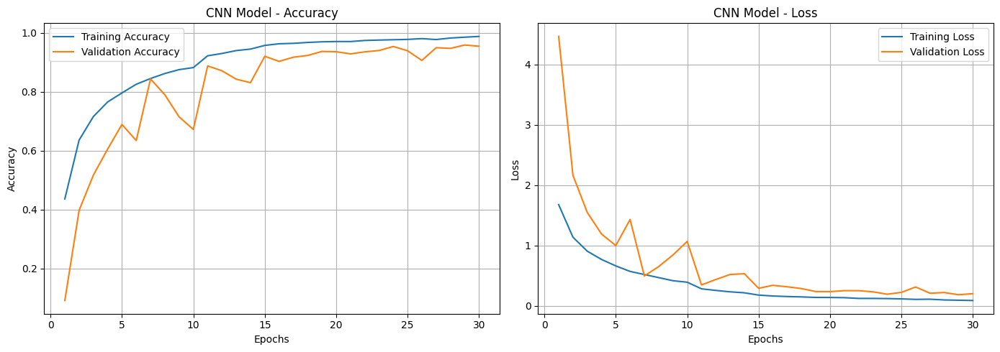

In [ ]:
plot_history(best_small_cnn_history)

### Insights from Learning Curve:

- Good Generalization: <br> By epoch 15, training and validation accuracy both plateau around 95%. Validation loss settles low and roughly tracks training loss, so we're not massively over- or under-fitting.

- Early-epoch noise: <br> Noticeable spikes in validation loss around epochs 7 and 10 (and the corresponding dips in val accuracy).

- Smooth convergence later: <br> After ~15 epochs, both curves settle into a smooth decline of loss and steady rise of accuracy. This suggests our network capacity is sufficient for the task, and it eventually "absorbs" the augmentation noise.



## 101x101 Images

### Best CNN

In [ ]:
def build_best_large_custom_cnn():
    # Best hyperparameters
    filters_block1 = 64
    filters_block2 = 64
    dense_units = 128
    dropout_rate = 0.2
    l2_reg = 0.0002833715647014918

    act_block1 = 'relu'
    act_block2 = 'relu'
    act_block3 = 'relu'
    act_dense = 'relu'

    optimizer_choice = 'adam'
    learning_rate = 0.0010643000310335154

    def get_activation(act_name):
        if act_name == 'relu':
            return tf.keras.layers.ReLU()
        elif act_name == 'leaky_relu':
            return tf.keras.layers.LeakyReLU()
        elif act_name == 'elu':
            return tf.keras.layers.ELU()
        else:
            raise ValueError(f"Unsupported activation: {act_name}")

    # Optimizer
    if optimizer_choice == 'adam':
        optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
    elif optimizer_choice == 'adamax':
        optimizer = tf.keras.optimizers.Adamax(learning_rate=learning_rate)
    elif optimizer_choice == 'nadam':
        optimizer = tf.keras.optimizers.Nadam(learning_rate=learning_rate)
    elif optimizer_choice == 'sgd':
        optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate)
    else:
        raise ValueError(f"Unsupported optimizer: {optimizer_choice}")

    reg = tf.keras.regularizers.l2(l2_reg)

    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(101, 101, 1)),

        # Block 1
        tf.keras.layers.Conv2D(filters_block1, (3, 3), padding='same', kernel_regularizer=reg),
        tf.keras.layers.BatchNormalization(),
        get_activation(act_block1),
        tf.keras.layers.Conv2D(filters_block1, (3, 3), padding='same', kernel_regularizer=reg),
        tf.keras.layers.BatchNormalization(),
        get_activation(act_block1),
        tf.keras.layers.Dropout(dropout_rate),

        # Block 2
        tf.keras.layers.Conv2D(filters_block2, (3, 3), padding='same', kernel_regularizer=reg),
        tf.keras.layers.BatchNormalization(),
        get_activation(act_block2),
        tf.keras.layers.Conv2D(filters_block2, (3, 3), padding='same', kernel_regularizer=reg),
        tf.keras.layers.BatchNormalization(),
        get_activation(act_block2),
        tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
        tf.keras.layers.Dropout(dropout_rate),

        # Block 3
        tf.keras.layers.Conv2D(128, (3, 3), padding='same', kernel_regularizer=reg),
        tf.keras.layers.BatchNormalization(),
        get_activation(act_block3),
        tf.keras.layers.Conv2D(128, (3, 3), padding='same', kernel_regularizer=reg),
        tf.keras.layers.BatchNormalization(),
        get_activation(act_block3),
        tf.keras.layers.Dropout(dropout_rate),

        # Classifier
        tf.keras.layers.GlobalAveragePooling2D(),
        tf.keras.layers.Dense(dense_units, kernel_regularizer=reg),
        tf.keras.layers.BatchNormalization(),
        get_activation(act_dense),
        tf.keras.layers.Dropout(dropout_rate),
        tf.keras.layers.Dense(11, activation='softmax')
    ])

    model.compile(
        optimizer=optimizer,
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    return model

In [ ]:
best_large_cnn = build_best_large_custom_cnn()
best_large_cnn.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)               │ (None, 101, 101, 64)   │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 101, 101, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_7 (ReLU)                  │ (None, 101, 101, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 101, 101, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 101, 101, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_8 (ReLU)                  │ (None, 101, 101, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 101, 101, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 101, 101, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 101, 101, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_9 (ReLU)                  │ (None, 101, 101, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 101, 101, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ (None, 101, 101, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_10 (ReLU)                 │ (None, 101, 101, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 50, 50, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 50, 50, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 50, 50, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_11          │ (None, 50, 50, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_11 (ReLU)                 │ (None, 50, 50, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 50, 50, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_12          │ (None, 50, 50, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_12 (ReLU)                 │ (None, 50, 50, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 50, 50, 128)    │             

 Total params: 353,355 (1.35 MB)

 Trainable params: 352,075 (1.34 MB)

 Non-trainable params: 1,280 (5.00 KB)

In [ ]:
best_large_cnn_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    'best_large_cnn_3.weights.h5', monitor='val_accuracy', save_best_only=True, save_weights_only=True, mode='max'
)


best_large_cnn_history = best_large_cnn.fit(
    large_train,
    validation_data=large_val,
    epochs=30,
    batch_size=32,
    verbose=2,
    callbacks=[custom_early_stop, reduce_lr, best_large_cnn_checkpoint]
)

Epoch 1/30
328/328 - 53s - 162ms/step - accuracy: 0.4657 - loss: 1.7233 - val_accuracy: 0.0859 - val_loss: 6.1868 - learning_rate: 0.0011
Epoch 2/30
328/328 - 33s - 102ms/step - accuracy: 0.6957 - loss: 1.0842 - val_accuracy: 0.4155 - val_loss: 2.7520 - learning_rate: 0.0011
Epoch 3/30
328/328 - 34s - 102ms/step - accuracy: 0.7848 - loss: 0.8309 - val_accuracy: 0.2827 - val_loss: 5.8604 - learning_rate: 0.0011
Epoch 4/30
328/328 - 34s - 102ms/step - accuracy: 0.8457 - loss: 0.6619 - val_accuracy: 0.4227 - val_loss: 3.2960 - learning_rate: 0.0011
Epoch 5/30
328/328 - 34s - 102ms/step - accuracy: 0.8756 - loss: 0.5554 - val_accuracy: 0.6777 - val_loss: 1.4370 - learning_rate: 0.0011
Epoch 6/30
328/328 - 34s - 102ms/step - accuracy: 0.9024 - loss: 0.4844 - val_accuracy: 0.4268 - val_loss: 2.9050 - learning_rate: 0.0011
Epoch 7/30
328/328 - 33s - 102ms/step - accuracy: 0.9137 - loss: 0.4481 - val_accuracy: 0.3232 - val_loss: 5.0418 - learning_rate: 0.0011
Epoch 8/30

Epoch 8: ReduceLROnPla

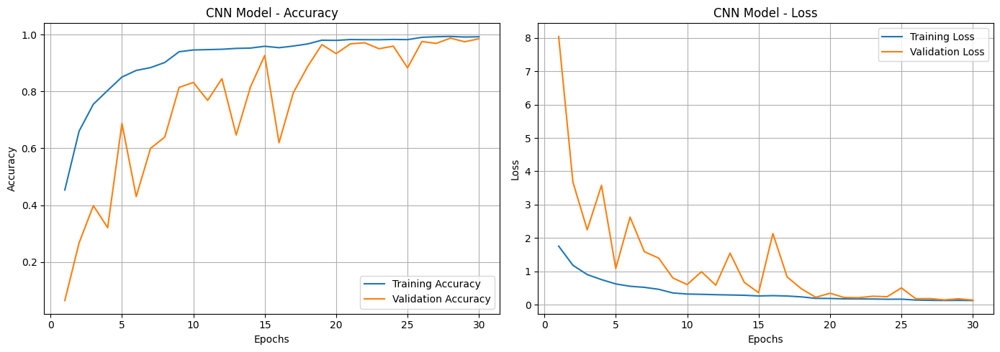

In [ ]:
plot_history(best_large_cnn_history)

### Insights from Learning Curve:

- Slower ramp-up: <br> Low starting accuracy (~6%) and very high validation loss (~8) in epoch 1 shows your model "feels" the full-sized images are a harder learning problem than tiny 23x23 patches. It takes until roughly epoch 10 before both training and validation accuracy crack 80%.

- Mid-training volatility: <br> Big swings in validation loss (spikes at epochs 3, 6, 11, 16, 25) and corresponding dips in val accuracy.

- Convergence and plateau: <br> After epoch 20, both curves smooth out: validation accuracy edges into the high-90s and validation loss drops below 0.2. Indicates our model eventually "learns through" the extra variability. Also converges nicer at the later epochs, with the validation accuracy almost the same as the training accuracy.

# Model Evaluation

In [ ]:
small_test = tf.keras.preprocessing.image_dataset_from_directory(
    "/content/Dataset for CA1 part A - AY2526S1/test",
    color_mode="grayscale",
    batch_size=32,
    image_size=(23,23),
    shuffle=True,
    seed=123
)

large_test = tf.keras.preprocessing.image_dataset_from_directory(
    "/content/Dataset for CA1 part A - AY2526S1/test",
    color_mode="grayscale",
    batch_size=32,
    image_size=(101, 101),
    shuffle=True,
    seed=123,
    labels='inferred',
    label_mode="int"
)

small_test = small_test.map(normalize_img)
large_test = large_test.map(normalize_img)

Found 2200 files belonging to 11 classes.
Found 2200 files belonging to 11 classes.


In [ ]:
# Evaluate model on the test dataset
small_cnn_loss, small_cnn_accuracy = best_small_cnn.evaluate(small_test)

print("CNN Test accuracy:", small_cnn_accuracy)

69/69 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.9611 - loss: 0.1566
CNN Test accuracy: 0.9595454335212708


In [ ]:
# Evaluate model on the test dataset
large_cnn_loss, large_cnn_accuracy = best_large_cnn.evaluate(large_test)

print("CNN Test accuracy:", large_cnn_accuracy)

69/69 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - accuracy: 0.9892 - loss: 0.1369
CNN Test accuracy: 0.9890909194946289


We can observe that the CNN trained and tested on 101x101 input performs better than the CNN trained on 23x23 input. We will further discuss this in our conclusion.

# Model's Weights

We reload the model's weights to confirm their functionality and also to ease reproducibility in the following sections.

In [ ]:
best_small_cnn = build_small_custom_cnn_best()
best_small_cnn.load_weights('/content/drive/MyDrive/Datasets/best_small_cnn1.weights.h5')

test_loss, test_accuracy = best_small_cnn.evaluate(small_test)
print(f"Test accuracy after loading weights: {test_accuracy:.4f}")

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adamax', because it has 2 variables whereas the saved optimizer has 62 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


69/69 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - accuracy: 0.9588 - loss: 0.1557
Test accuracy after loading weights: 0.9600


In [ ]:
best_large_cnn = build_best_large_custom_cnn()
best_large_cnn.load_weights('/content/drive/MyDrive/Datasets/best_large_cnn_3.weights.h5')

test_loss, test_accuracy = best_large_cnn.evaluate(large_test)
print(f"Test accuracy after loading weights: {test_accuracy:.4f}")

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 62 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


69/69 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step - accuracy: 0.9894 - loss: 0.1405
Test accuracy after loading weights: 0.9895


## Model Metrics

Confusion matrices, and model layers will be visualized in this section.

In [ ]:
def plot_confusion_matrix(name, model, test_dataset, class_names):
    # Get true labels and predictions
    y_true = []
    y_pred = []

    for X_batch, y_batch in test_dataset:
        # Check if y_batch is one-hot encoded or integer labels
        if len(y_batch.shape) == 2:  # One-hot encoded labels (batch_size, num_classes)
            y_true.extend(np.argmax(y_batch.numpy(), axis=1))
        else:  # Integer labels (batch_size,)
            y_true.extend(y_batch.numpy())

        # Get predictions
        y_pred_probs = model.predict(X_batch, verbose=0)
        y_pred.extend(np.argmax(y_pred_probs, axis=1))  # Predicted class indices

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    # Compute the confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

    # Plot the confusion matrix
    fig, ax = plt.subplots(figsize=(12, 10))
    disp.plot(cmap=plt.cm.Blues, ax=ax, xticks_rotation=90)
    plt.title(f"Confusion Matrix: {name}", fontsize=16)
    plt.tight_layout()
    plt.show()

    # Class-wise Accuracy
    print("Class-wise Accuracy:\n")
    total_per_class = cm.sum(axis=1)
    correct_per_class = np.diag(cm)
    for i, class_name in enumerate(class_names):
        acc = correct_per_class[i] / total_per_class[i]
        print(f"{class_name:30}: {acc:.2%}")

    # Overall Accuracy
    overall_acc = np.sum(correct_per_class) / np.sum(cm)
    print(f"\nOverall Accuracy: {overall_acc:.2%}")

    print('-'*100)

### Confusion Matrix for the 23x23 Resnet model

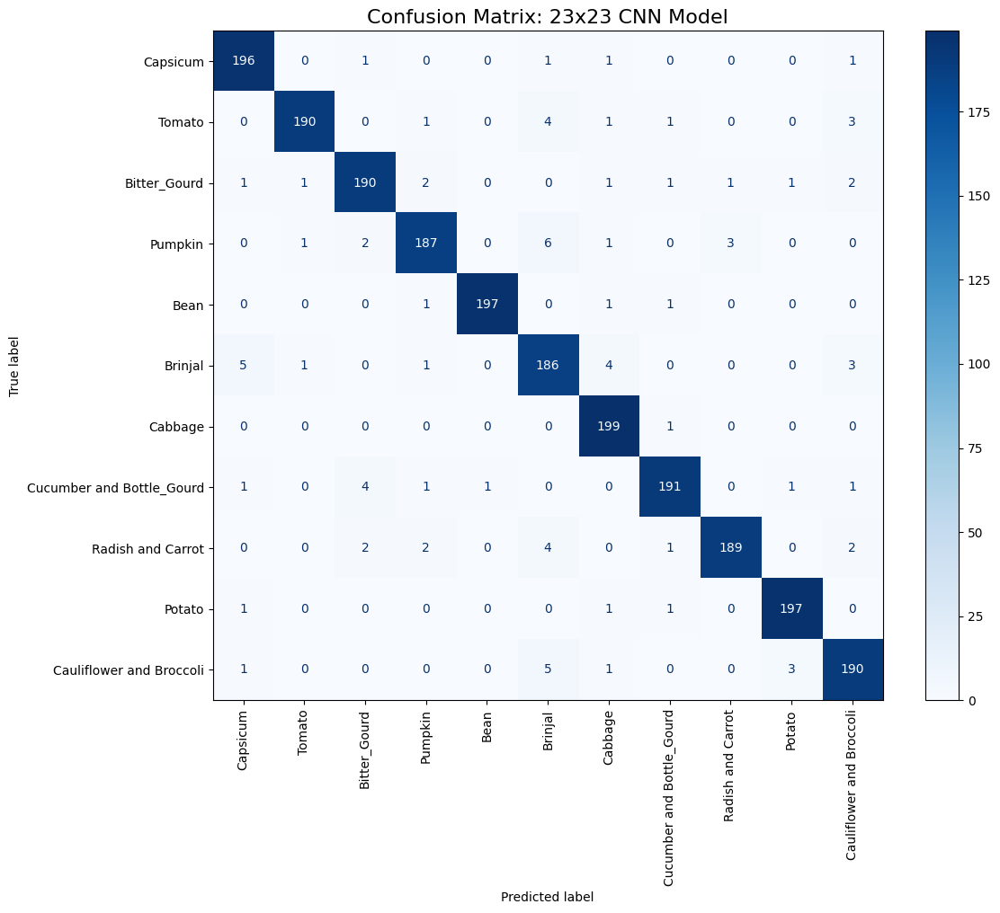

Class-wise Accuracy:

Capsicum                      : 98.00%
Tomato                        : 95.00%
Bitter_Gourd                  : 95.00%
Pumpkin                       : 93.50%
Bean                          : 98.50%
Brinjal                       : 93.00%
Cabbage                       : 99.50%
Cucumber and Bottle_Gourd     : 95.50%
Radish and Carrot             : 94.50%
Potato                        : 98.50%
Cauliflower and Broccoli      : 95.00%

Overall Accuracy: 96.00%
----------------------------------------------------------------------------------------------------


In [ ]:
plot_confusion_matrix("23x23 CNN Model", best_small_cnn, small_test, class_names=class_names)

In [ ]:
# Collect true and predicted labels
y_true = []
y_pred = []

for images, labels in small_test:
    predictions = best_small_cnn.predict(images, verbose=0)
    predicted_labels = np.argmax(predictions, axis=1)
    y_true.extend(labels.numpy())
    y_pred.extend(predicted_labels)

# Generate classification report
report = classification_report(y_true, y_pred, target_names=class_names)
print("Classification Report for the 23x23 Model:\n")
print(report)

Classification Report:

                           precision    recall  f1-score   support

                     Bean       0.96      0.98      0.97       200
             Bitter_Gourd       0.98      0.95      0.97       200
                  Brinjal       0.95      0.95      0.95       200
                  Cabbage       0.96      0.94      0.95       200
                 Capsicum       0.99      0.98      0.99       200
 Cauliflower and Broccoli       0.90      0.93      0.92       200
Cucumber and Bottle_Gourd       0.95      0.99      0.97       200
                   Potato       0.97      0.95      0.96       200
                  Pumpkin       0.98      0.94      0.96       200
        Radish and Carrot       0.98      0.98      0.98       200
                   Tomato       0.94      0.95      0.95       200

                 accuracy                           0.96      2200
                macro avg       0.96      0.96      0.96      2200
             weighted avg       0.96

### Confusion Matrix for the 101x101 best model

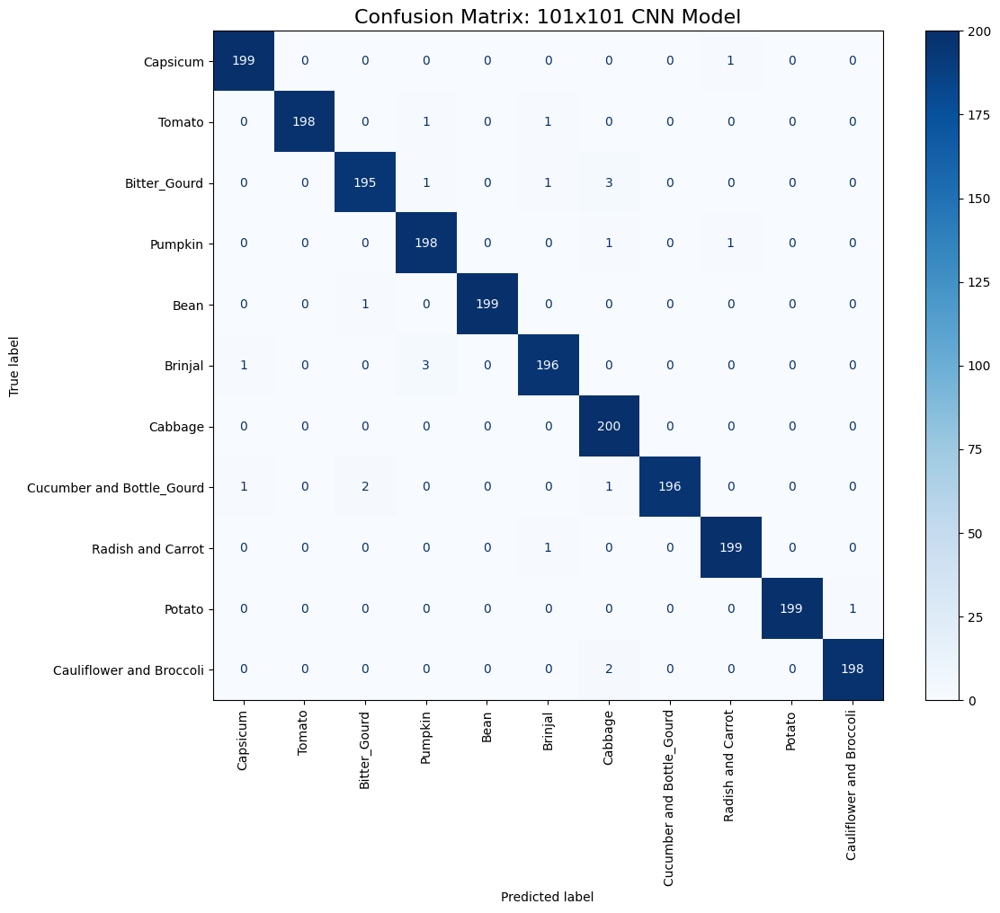

Class-wise Accuracy:

Capsicum                      : 99.50%
Tomato                        : 99.00%
Bitter_Gourd                  : 97.50%
Pumpkin                       : 99.00%
Bean                          : 99.50%
Brinjal                       : 98.00%
Cabbage                       : 100.00%
Cucumber and Bottle_Gourd     : 98.00%
Radish and Carrot             : 99.50%
Potato                        : 99.50%
Cauliflower and Broccoli      : 99.00%

Overall Accuracy: 98.95%
----------------------------------------------------------------------------------------------------


In [ ]:
plot_confusion_matrix("101x101 CNN Model", best_large_cnn, large_test, class_names=class_names)

In [ ]:
# Collect true and predicted labels
y_true = []
y_pred = []

for images, labels in large_test:
    predictions = best_large_cnn.predict(images, verbose=0)
    predicted_labels = np.argmax(predictions, axis=1)
    y_true.extend(labels.numpy())
    y_pred.extend(predicted_labels)

# Generate classification report
report = classification_report(y_true, y_pred, target_names=class_names)
print("Classification Report for the 101x101 Model:\n")
print(report)

Classification Report for the 101x101 Model:

                           precision    recall  f1-score   support

                     Bean       0.99      0.99      0.99       200
             Bitter_Gourd       1.00      0.99      0.99       200
                  Brinjal       0.98      0.97      0.98       200
                  Cabbage       0.98      0.99      0.98       200
                 Capsicum       1.00      0.99      1.00       200
 Cauliflower and Broccoli       0.98      0.98      0.98       200
Cucumber and Bottle_Gourd       0.97      1.00      0.98       200
                   Potato       1.00      0.98      0.99       200
                  Pumpkin       0.99      0.99      0.99       200
        Radish and Carrot       1.00      0.99      1.00       200
                   Tomato       0.99      0.99      0.99       200

                 accuracy                           0.99      2200
                macro avg       0.99      0.99      0.99      2200
             w

## Insights from the Confusion Matrices

**23x23 model:** We see quite a few off-diagonal cells (e.g. Brinjal -> Capsicum, Pumpkin -> Brinjal, Cauliflower&Broccoli -> Potato, etc.). Overall accuracy is high, but there's still noticeable “bleed” between visually similar classes.

**101x101 model:** The vast majority of predictions land on the diagonal. Only a handful of mistakes remain (e.g. Bitter Gourd -> Bottle Gourd, Cauliflower&Broccoli -> Potato, Brinjal -> Pumpkin), and even those are mostly just 1-3 images per class.

**Insights**: More resolution preserves fine-grained textures and shape cues, letting the network disambiguate pumpkins and capsicums for instance, much more reliably.


On small inputs, any shapes or textures that overlap between “pairs” of vegetables (e.g. the rough rind of both pumpkin and bitter gourd) become easy to confuse.

On larger inputs, those same cues (vein patterns, stalk shapes, surface texture) become distinct again, so the model almost never mistakes one for the other.

<br><br>

**What this tells us:** <br> **Spatial detail matters:** At 23x23, we're sometimes down to a handful of pixels for a leaf edge or color gradient; at 101x101, those features are much richer.

## Error Analysis


Here, we will view the images that our model got wrong for analysis.

In [ ]:
def error_analyze(class_names, model, test):
    # 1. Extract all test images and labels
    X_test = []
    y_test = []

    for images, labels in test:
        X_test.extend(images.numpy())   # convert to NumPy
        y_test.extend(labels.numpy())

    X_test = np.array(X_test)
    y_test = np.array(y_test)

    # 2. Make predictions
    y_pred_probs = model.predict(X_test)
    y_pred_classes = np.argmax(y_pred_probs, axis=1)

    # 3. Identify misclassified indices
    wrong_indices = np.where(y_pred_classes != y_test)[0]

    # 4. Show top-2 predictions for some wrong predictions
    N = 5
    rows = []

    for idx in wrong_indices[:N]:
        probs = y_pred_probs[idx]
        top2 = probs.argsort()[-2:][::-1]  # descending top 2

        rows.append({
            'Index': idx,
            'Actual Label': y_test[idx],
            'Actual Class': class_names[y_test[idx]],
            'Predicted Label': y_pred_classes[idx],
            'Predicted Class': class_names[y_pred_classes[idx]],
            'Top-1 Class': class_names[top2[0]],
            'Top-1 Prob': probs[top2[0]],
            'Top-2 Class': class_names[top2[1]],
            'Top-2 Prob': probs[top2[1]],
        })

    top_errors = pd.DataFrame(rows)
    display(top_errors)
    return (X_test, y_test, rows)


class_names = sorted(os.listdir("/content/Dataset for CA1 part A - AY2526S1/train"))

### Error Analysis for 23x23 Model

In [ ]:
X_test_small, y_test_small, rows_small = error_analyze(class_names, best_small_cnn, small_test)

69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


,Index,Actual Label,Actual Class,Predicted Label,Predicted Class,Top-1 Class,Top-1 Prob,Top-2 Class,Top-2 Prob
0,91,1,Bitter_Gourd,3,Cabbage,Cabbage,0.805765,Bitter_Gourd,0.126022
1,101,4,Capsicum,3,Cabbage,Cabbage,0.513060,Capsicum,0.386378
2,106,5,Cauliflower and Broccoli,6,Cucumber and Bottle_Gourd,Cucumber and Bottle_Gourd,0.666534,Cauliflower and Broccoli,0.267308
3,143,2,Brinjal,3,Cabbage,Cabbage,0.663792,Brinjal,0.130903
4,145,10,Tomato,9,Radish and Carrot,Radish and Carrot,0.605660,Cauliflower and Broccoli,0.115429


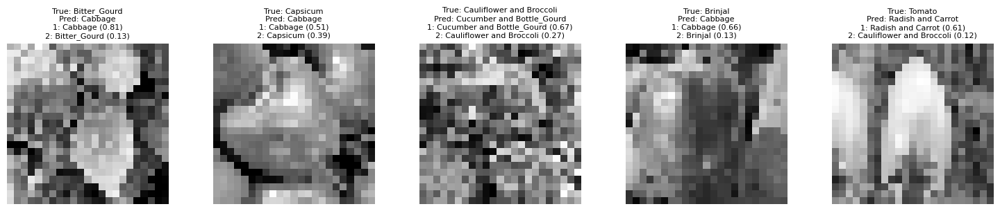

In [ ]:
N = len(rows_small)
cols = min(N, 5)  # up to 5 images per row
rows_needed = (N + cols - 1) // cols

fig, axes = plt.subplots(rows_needed, cols, figsize=(cols * 3, rows_needed * 3))

if rows_needed == 1:
    axes = np.expand_dims(axes, axis=0)  # make 2D if only 1 row

for i, row in enumerate(rows_small):
    r, c = divmod(i, cols)
    ax = axes[r][c]

    img = X_test_small[row['Index']].squeeze()
    ax.imshow(img, cmap='gray')

    actual = class_names[row['Actual Label']]
    pred = class_names[row['Predicted Label']]
    top1 = row['Top-1 Class']
    top2 = row['Top-2 Class']

    ax.set_title(f"True: {actual}\nPred: {pred}\n1: {top1} ({row['Top-1 Prob']:.2f})\n2: {top2} ({row['Top-2 Prob']:.2f})", fontsize=8)
    ax.axis('off')

# Hide any unused subplots
for i in range(N, rows_needed * cols):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout()
plt.show()

First image: We can see that the images's true label is a bitter gourd, however, the model was 83% sure it was cabbage, and 13% sure it was bitter gourd. To the human eye, it is understandable why the model thinks so. The circular shape with the white center shows features similar to that of a cabbage, hence it is a reasonable prediction. Futhermore, the model was able to slightly guess that it was a bitter gourd, with a 13% confidence.


Second image: The model closely predicts between Cabbage and Capsicum. They both tend to have the same round and circular shape, and it is a reasonable prediction.

Third image: To the human eye, it is completely indistunguishable. There are no specific shapes to hint that this is a Cauliflower and Broccoli. It is impressive that the model is able to guess the correct class with a 27% confidence. This shows that our model has potential.

Fourth image: The brinjals in the dataset have different shapes and sizes. For this brinjal, we can see that it follows a circular, smooth round shape. It is a reasonable prediction of our model to predict Cabbage. Furthermore, it was able to guess brinjal with a 13% confidence rate. It is somewhat impressive.

Lastly, the last image was a Tomato. However, it is shaped like a Radish. Even I would have guessed a Radish or Carrot. Therefore it is a reasonable guess in my opinion.

### Error Analysis for 101x101 Model

In [ ]:
X_test_large, y_test_large, rows_large = error_analyze(class_names, best_large_cnn, large_test)

69/69 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step


,Index,Actual Label,Actual Class,Predicted Label,Predicted Class,Top-1 Class,Top-1 Prob,Top-2 Class,Top-2 Prob
0,164,1,Bitter_Gourd,3,Cabbage,Cabbage,0.918178,Bitter_Gourd,0.024346
1,233,3,Cabbage,6,Cucumber and Bottle_Gourd,Cucumber and Bottle_Gourd,0.909914,Cabbage,0.085638
2,298,7,Potato,6,Cucumber and Bottle_Gourd,Cucumber and Bottle_Gourd,0.490984,Potato,0.203611
3,361,5,Cauliflower and Broccoli,3,Cabbage,Cabbage,0.804141,Cauliflower and Broccoli,0.165774
4,363,8,Pumpkin,5,Cauliflower and Broccoli,Cauliflower and Broccoli,0.818096,Pumpkin,0.122512


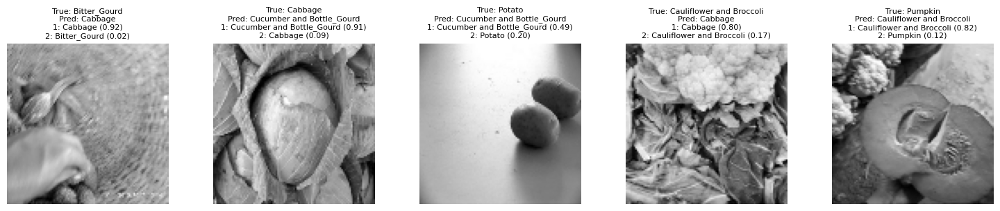

In [ ]:
N = len(rows_large)
cols = min(N, 5)  # up to 5 images per row
rows_needed = (N + cols - 1) // cols

fig, axes = plt.subplots(rows_needed, cols, figsize=(cols * 3, rows_needed * 3))

if rows_needed == 1:
    axes = np.expand_dims(axes, axis=0)  # make 2D if only 1 row

for i, row in enumerate(rows_large):
    r, c = divmod(i, cols)
    ax = axes[r][c]

    img = X_test_large[row['Index']].squeeze()
    ax.imshow(img, cmap='gray')

    actual = class_names[row['Actual Label']]
    pred = class_names[row['Predicted Label']]
    top1 = row['Top-1 Class']
    top2 = row['Top-2 Class']

    ax.set_title(f"True: {actual}\nPred: {pred}\n1: {top1} ({row['Top-1 Prob']:.2f})\n2: {top2} ({row['Top-2 Prob']:.2f})", fontsize=8)
    ax.axis('off')

# Hide any unused subplots
for i in range(N, rows_needed * cols):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout()
plt.show()

First image: The basket holding the bitter gourds has a similar texture to cabbages. This may introduce noise to our model, which would cause it to predict unexpectedly. It is a justificable error to predict cabbage.

Second image: The model predicts a cucumber or bottle gourd, however, it is clearly a cabbage. Hence, this is a unreasonable error, and the model predicted this one poorly.

Third image: The potatos and cucumbers and bottle gourds carry similar structure, and our model might end up predicting either class wrongly. Hence, it is a reasonable error.

Fourth image: We can see a cauliflower, however, there is unnecessary noise in the background, which can lead to poor model predictions. Hence, it is a reasonable error.

Lastly, even though we can clearly see a pumpkin, we can observe a certain texture in the background which can lead to possible predictions such as cauliflower due to similar texture. Hence, this is a reasonable error.

## Model Architecture

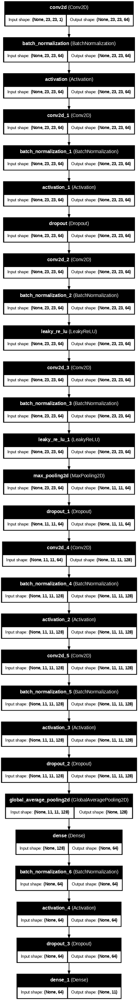

In [ ]:
tf.keras.utils.plot_model(best_small_cnn, show_shapes=True, show_layer_names=True, dpi=70, to_file='small_model_architecture.png')

/usr/local/lib/python3.11/dist-packages/visualkeras/layered.py:86: UserWarning: The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.
  warnings.warn("The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.")


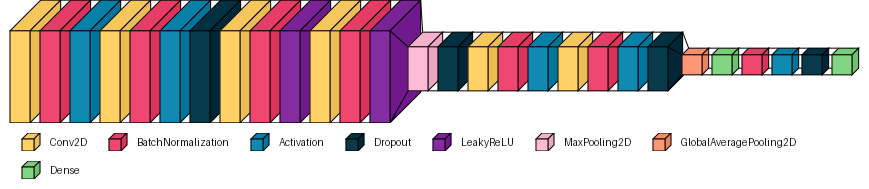

In [ ]:
# Use a smaller font for better layout
try:
    font = ImageFont.truetype("arial.ttf", 12)
except:
    font = None

# Render the layered view and display it
image = visualkeras.layered_view(best_small_cnn, legend=True, draw_volume=True, font=font)
display(image)

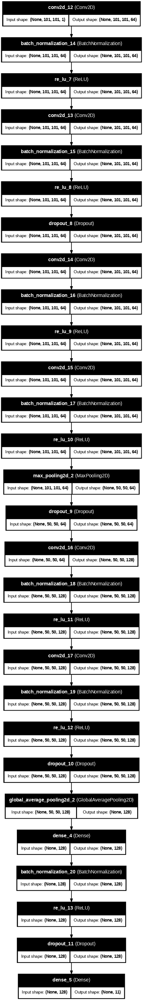

In [ ]:
tf.keras.utils.plot_model(best_large_cnn, show_shapes=True, show_layer_names=True, dpi=70, to_file='large_model_architecture.png')

/usr/local/lib/python3.11/dist-packages/visualkeras/layered.py:86: UserWarning: The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.
  warnings.warn("The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.")


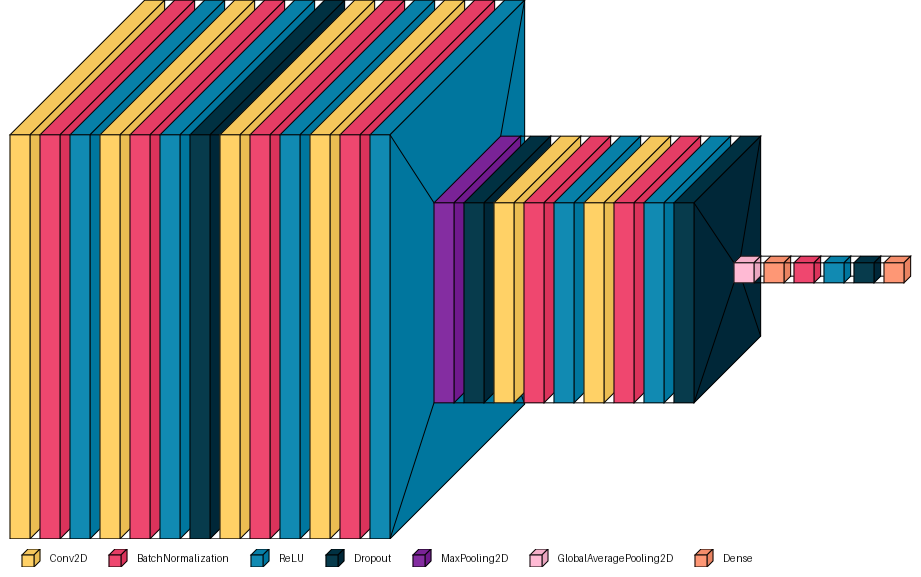

In [ ]:
# Use a smaller font for better layout
try:
    font = ImageFont.truetype("arial.ttf", 12)
except:
    font = None

# Render the layered view and display it
image = visualkeras.layered_view(best_large_cnn, legend=True, draw_volume=True, font=font)
display(image)

# Comparing the classification accuracies of both 23x23 and 101x101 models.


We can observe that the model for the 23x23 images had an accuracy of about *95-96%, whereas the model for the 101x101 images had an accuracy of about *99%.

*(may vary a bit due to rerunning the code)


## Why does the model trained and tested on 101x101 images perform better?

- **Higher Spatial Resolution.**

Higher spatial resolution typically means more informative features. **Fine patterns, edges, or textures that help distinguish between classes may get lost** during aggressive downscaling. <br><br>At 23x23, a single convolution kernel **might cover a large proportion of the object, reducing the model's ability to detect localized, discriminative features.**

<br>

- **Better Generalization**

When the input is **rich in detail**, the model learns more **generalizable and discriminative features**, leading to improved accuracy on unseen data. <br><br>23x23 inputs might lead the model to memorize coarse features (e.g., object shape) but **miss nuances** (e.g., texture, borders).


## Insights

<br><hr><br>

### Model trained on 23x23 Images

- Advantages

The model trained with 23x23 pixel images exhibits a **significantly faster training time** compared to the model trained with 101x101 images. This is largely due to the **smaller input size, which requires fewer computations for both forward and backward passes during training.**

<br>

This makes the 23x23 model a more attractive option for scenarios where **quick model iteration is necessary such as real-time computations**. Moreover, the smaller model size also implies that the 23x23 resolution would be more **suitable for deployment on edge devices, such as mobile phones or IoT devices, which often have limited processing power and memory.**

- Disadvantages

However, while the 23x23 model performs quite efficiently in terms of speed, there is a **noticeable trade-off in accuracy**. The 95% accuracy is respectable, but it comes at the cost of losing fine-grained information available in higher resolution images.

<br>

The relatively lower accuracy **may not be a significant issue in many real-time applications, such as face recognition, object detection in low-resource environments, or simple classification tasks where a small error margin is acceptable.** However, for more **sensitive applications, the decrease in accuracy could lead to undesirable outcomes.**

<br><hr><br>

### Model Trained on 101x101 Images

- Advantages

On the other hand, the model trained with 101x101 images **achieves an accuracy of 99%, which is clearly superior in terms of predictive power.** The increased resolution allows the model to capture more fine-grained details, which can be crucial in domains **requiring high precision**.

<br>

For example, in medical AI applications, such as **cancer detection or diagnostic imaging, the ability to discern subtle patterns or abnormalities in high-resolution images can be the difference between an accurate diagnosis and a false one. In such cases, sacrificing accuracy for speed or resource efficiency would not be acceptable.**

- Disadvantages

The trade-off, however, is that the 101x101 model **requires considerably more computational resources, both in terms of memory and processing power.** Larger input sizes increase the complexity of the model, leading to **longer training times and higher resource consumption during inference.** For deployment on devices with limited computational capabilities, this could pose significant challenges.

<br>

Additionally, the increased memory requirements for higher-resolution images could **limit the scalability of the model when dealing with large datasets.**


<br><hr><br>

## To summarize:

<br>

The choice between 23x23 and 101x101 image resolutions is a **balancing act between speed and accuracy.**

<br>

For **real-time applications and deployment on edge devices, the 23x23 resolution may be more practical despite the slight accuracy loss.**

<br>

Conversely, **when high precision is crucial, such as in medical AI or high-stakes industrial applications, the 101x101 resolution offers superior accuracy, at the cost of increased computational demand.**

<br><br>

Ultimately, the decision on which model to deploy depends on the **specific requirements of the task at hand, the computational resources available, and the acceptable margin of error for the application.** Further experimentation, including the use of intermediate resolutions or techniques such as **transfer learning**, may help mitigate some of these trade-offs.

